In [2]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines3 import PPO, DQN, A2C
from stable_baselines3.common.vec_env import DummyVecEnv
from gymnasium import spaces

with open('../database/c_states_dict_v4.pkl', 'rb') as f:
    c_states = pickle.load(f)

print(c_states.keys())
print(c_states[5].shape)

dict_keys([5, 2.5, 0, -2.5, -5])
(2500, 18, 7, 120)


In [3]:
class FrequencyDetectionEnv(gym.Env):
    """Custom Environment for Frequency Objective Response Detection that follows gymnasium interface"""

    def __init__(self, data):
        super(FrequencyDetectionEnv, self).__init__()

        self.data = data
        self.episodes = data.shape[0]-1
        self.frequencies = data.shape[1]-1
        self.measures = data.shape[2]
        self.windows = data.shape[3]-1
        self.current_episode = 0
        self.current_window = 2
        self.current_frequency = 0

        # Action space: 0 (no detection) or 1 (detection)
        self.action_space = spaces.Discrete(2)

        # Observation space: 5 measures for each of the 4 frequencies (1 focus + 3 noise)
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4*self.measures,), dtype=np.float32)

        # Initialize the internal state
        self.state = None
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0   
        self.tpr_hist = []
        self.fpr_hist = []
        self.latest_result = {'tp_rate':np.nan,'fp_rate':np.nan}

    def reset(self, seed=None, options=None):
        """Resets the environment to an initial state and returns the initial observation."""
        super().reset(seed=seed)
        
        if  self.current_episode< self.episodes:
            self.current_episode +=1
        else:
            self.current_episode = np.random.randint(0, self.episodes)

        self.current_window = 2
        self.current_frequency = 0
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0        
         
        self.tpr_hist = []
        self.fpr_hist = []
        
        # Initialize the state
        self.state = self._get_state(self.current_frequency, self.current_window)
        return self.state, self.latest_result

    def _get_state(self, frequency, window, episode= 0):
        """Helper function to get the state at a given frequency and window."""
         
        if episode != 0:
            self.current_episode = episode

        focus_measure = self.data[self.current_episode, frequency, :, window]
        
        # Select 3 random noise frequencies, excluding the current focus frequency
        noise_indices = np.setdiff1d(np.arange(9, 17), frequency - 9 if frequency >= 9 else [])
        noise_frequencies = np.random.choice(noise_indices, 3, replace=False)
        noise_measures = [self.data[self.current_episode, nf, :, window] for nf in noise_frequencies]
         
        measures = np.concatenate(([focus_measure], noise_measures), axis=0).flatten()

        return np.array(measures, dtype=np.float32)

    def step(self, action, episode = -1):
        """Executes one time step within the environment."""
        # Returns:
        # tuple (observation, reward, terminated, truncated, info).
        # Return type:
        # Tuple[Tuple | Dict[str, Any] | ndarray | int, float, bool, bool, Dict]
        
        if episode != -1:
            self.current_episode = episode

        reward = 0
        kp_fp = 1
        fp_des = 0.01

        should_detect = self.current_frequency <= 8
        if action == 1:
            if should_detect:
                self.true_positives += 1
            else:
                self.false_positives += 1

        self.current_frequency += 1
        window_done = self.current_frequency >= self.frequencies
        epsiode_terminated = self.current_window >= self.windows
        info = {'tp_rate':np.nan,'fp_rate':np.nan}

        if window_done:
            self.state = self._get_state(self.current_frequency-1, self.current_window)

            current_ep_prog = 100
            
            self.tp_rate = 100*self.true_positives / (self.frequencies//2+1)
            self.fp_rate = 100*self.false_positives / (self.frequencies//2+1)
                
            reward = +( -(((100-fp_des)**2)/100 +(fp_des**2)/-100) +((self.fp_rate)**2)/(-100)+ ((self.tp_rate)**2)/(100) )*current_ep_prog/100
            
            self.tpr_hist.append(self.tp_rate)
            self.fpr_hist.append(self.fp_rate)

            if not(epsiode_terminated):
                self.current_window += 1
                self.current_frequency = 0
                self.true_positives = 0
                self.false_positives = 0
                    
        if epsiode_terminated:
            self.state = self._get_state(self.current_frequency, self.current_window)
            current_ep_prog =100

            self.tp_rate = 100*self.true_positives / (self.current_frequency+1)
            self.fp_rate = 100*self.false_positives / (self.current_frequency+1)

            reward = +( -(((100-fp_des)**2)/100+(fp_des**2)/-100)
                    +(kp_fp*(np.round(np.mean(self.fpr_hist),4))**2)/(-100)
                    +((np.round(np.mean(self.tpr_hist),4))**2)/(100))*current_ep_prog/100
           
            truncated = False

            info = {'tp_rate':np.round(np.mean(self.tpr_hist),2),'fp_rate':np.round(np.mean(self.fpr_hist),2)}
            self.latest_result = info

            self.tpr_hist = []
            self.fpr_hist = [] 
            self.current_window = 2
            self.current_frequency = 0
            self.true_positives = 0
            self.false_positives = 0

        else:
            self.state = self._get_state(self.current_frequency, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 1
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 1
                else:
                    tn = 1

            reward = tp-kp_fp*fp-fn+tn

            truncated = False

        return self.state, reward, epsiode_terminated, truncated, info
    def render(self, mode='human'):
        """Render the environment for visualization purposes."""
        if mode=='human':
            print(f'Window: {self.current_window}, Frequency: {self.current_frequency},TP: {self.tp_rate}, FP: {self.fp_rate}')

    def close(self):
        """Clean up any resources used by the environment."""
        pass

In [4]:
class TEST_FrequencyDetectionEnv(gym.Env):
    """Custom Environment for Frequency Objective Response Detection that follows gymnasium interface"""

    def __init__(self, data):
        super(TEST_FrequencyDetectionEnv, self).__init__()

        self.data = data
        self.episodes = data.shape[0]-1
        self.frequencies = data.shape[1]-1
        self.measures = data.shape[2]
        self.windows = data.shape[3]-1
        self.current_episode = 0
        self.current_window = 2
        self.current_frequency = 0

        # Action space: 0 (no detection) or 1 (detection)
        self.action_space = spaces.Discrete(2)

        # Observation space: 5 measures for each of the 4 frequencies (1 focus + 3 noise)
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4*self.measures,), dtype=np.float32)

        # Initialize the internal state
        self.state = None
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0   
        self.tpr_hist = []
        self.fpr_hist = []  
        self.latest_result = {'tp_rate':np.nan,'fp_rate':np.nan}   

    def reset(self, seed=None, options=None):
        """Resets the environment to an initial state and returns the initial observation."""
        super().reset(seed=seed)
        
        if  self.current_episode< self.episodes:
            self.current_episode +=1
        else:
            self.current_episode = np.random.randint(0, self.episodes)

        self.current_window = 2
        self.current_frequency = 0
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0        
         
        self.tpr_hist = []
        self.fpr_hist = []
        
        # Initialize the state
        self.state = self._get_state(self.current_frequency, self.current_window)
        return self.state, self.latest_result

    def _get_state(self, frequency, window, episode= 0):
        """Helper function to get the state at a given frequency and window."""
         
        if episode != 0:
            self.current_episode = episode
         
        # print(frequency)
        focus_measure = self.data[self.current_episode, frequency, :, window]
        
        # Select 3 random noise frequencies, excluding the current focus frequency
        noise_indices = np.setdiff1d(np.arange(9, 17), frequency - 9 if frequency >= 9 else [])
        noise_frequencies = np.random.choice(noise_indices, 3, replace=False)
        noise_measures = [self.data[self.current_episode, nf, :, window] for nf in noise_frequencies]
         
        measures = np.concatenate(([focus_measure], noise_measures), axis=0).flatten()
       
        return np.array(measures, dtype=np.float32)

    def step(self, action, episode = -1):
        """Executes one time step within the environment."""
        # Returns:
        # tuple (observation, reward, terminated, truncated, info).
        # Return type:
        # Tuple[Tuple | Dict[str, Any] | ndarray | int, float, bool, bool, Dict]

        if episode != -1:
            self.current_episode = episode

        reward = 0
        fp_des = 0.01

        should_detect = self.current_frequency <= 8
        if action == 1:
            if should_detect:
                self.true_positives += 1
            else:
                self.false_positives += 1

        self.current_frequency += 1
        window_done = self.current_frequency >= self.frequencies
        epsiode_terminated = self.current_window >= self.windows
        info = {'tp_rate':np.nan,'fp_rate':np.nan}
        if window_done:
            self.state = self._get_state(self.current_frequency-1, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn


            self.tp_rate = 100*self.true_positives / (self.frequencies//2+1)
            self.fp_rate = 100*self.false_positives / (self.frequencies//2+1)

            self.tpr_hist.append(self.tp_rate)
            self.fpr_hist.append(self.fp_rate)

            if not(epsiode_terminated):
                self.current_window += 1
                self.current_frequency = 0
                self.true_positives = 0
                self.false_positives = 0
                    
        if epsiode_terminated:
            self.state = self._get_state(self.current_frequency, self.current_window)

            self.tp_rate = 100*self.true_positives / (self.current_frequency+1)
            self.fp_rate = 100*self.false_positives / (self.current_frequency+1)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn
           
            truncated = False

            info = {'tp_rate':np.round(np.mean(self.tpr_hist),2),'fp_rate':np.round(np.mean(self.fpr_hist),2)}
            self.latest_result = info

            self.tpr_hist = []
            self.fpr_hist = [] 
            self.current_window = 2
            self.current_frequency = 0
            self.true_positives = 0
            self.false_positives = 0

        else:
            self.state = self._get_state(self.current_frequency, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn

            truncated = False

        reward = tp-fp-fn+tn

        return self.state, reward, epsiode_terminated, truncated, info

    def render(self, mode='human'):
        """Render the environment for visualization purposes."""
        if mode =='human':
            print(f'Window: {self.current_window}, Frequency: {self.current_frequency},TP: {self.tp_rate}, FP: {self.fp_rate}')

    def close(self):
        """Clean up any resources used by the environment."""
        pass


# SNR = 5

In [4]:
snr = 5
data = c_states[snr]
timesteps = 120*17*1000
print(f'Total decisions: {timesteps}')

Total decisions: 2040000


In [5]:
# Train PPO model
env = FrequencyDetectionEnv(data)
model_ppo = PPO('MlpPolicy', env, verbose=1)
model_ppo.learn(total_timesteps=timesteps)
model_ppo.save('comp_ppo_snr5-5.zip')
_, latest = env.reset()
print(latest)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.99e+03 |
|    ep_rew_mean     | -126     |
| time/              |          |
|    fps             | 1036     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.99e+03    |
|    ep_rew_mean          | -30.7       |
| time/                   |             |
|    fps                  | 666         |
|    iterations           | 2           |
|    time_elapsed         | 6           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.012886453 |
|    clip_fraction        | 0.153       |
|    clip_range           | 0.2         |
|    entropy_loss   

In [6]:
# Train DQN model
env = FrequencyDetectionEnv(data)
model_dqn = DQN('MlpPolicy', env, verbose=1)
model_dqn.learn(total_timesteps=timesteps)
model_dqn.save('comp_dqn_snr5-5.zip')
_, latest = env.reset()
print(latest)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.99e+03 |
|    ep_rew_mean      | -58.7    |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 845      |
|    time_elapsed     | 9        |
|    total_timesteps  | 7960     |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.289    |
|    n_updates        | 1964     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.99e+03 |
|    ep_rew_mean      | -39.5    |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 833      |
|    time_elapsed     | 19       |
|    total_timesteps  | 15920    |
| train/              |        

In [7]:
env = FrequencyDetectionEnv(data)
model_a2c = A2C('MlpPolicy', env, verbose=1)
model_a2c.learn(total_timesteps=timesteps)
model_a2c.save('comp_a2c_snr5-5.zip')
_, latest = env.reset()
print(latest)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
------------------------------------
| time/                 |          |
|    fps                | 467      |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -0.387   |
|    explained_variance | 0.493    |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | 0.767    |
|    value_loss         | 2.12     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 467      |
|    iterations         | 200      |
|    time_elapsed       | 2        |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -0.196   |
|    explained_variance | -0.00064 |
|    learning_rate      | 0.0007   |
|    n_updates    

In [8]:
def retrain(snr):
    data = c_states[snr]

    # Train PPO model
    env = FrequencyDetectionEnv(data)
    model_ppo = PPO.load('comp_ppo_snr5-5.zip', env=env)
    model_ppo.learn(total_timesteps=timesteps)
    model_ppo.save('comp_ppo_snr5-5.zip')
    _, latest = env.reset()
    print('\nPPO:')
    print(latest)

    # Train DQN model
    env = FrequencyDetectionEnv(data)
    model_dqn = DQN.load('comp_dqn_snr5-5.zip', env=env)
    model_dqn.learn(total_timesteps=timesteps)
    model_dqn.save('comp_dqn_snr5-5.zip')
    _, latest = env.reset()
    print('\nDQN:')
    print(latest)

    env = FrequencyDetectionEnv(data)
    model_a2c = A2C.load('comp_a2c_snr5-5.zip', env=env)
    model_a2c.learn(total_timesteps=timesteps)
    model_a2c.save('comp_a2c_snr5-5.zip')
    _, latest = env.reset()
    print('\nA2C:')
    print(latest)

    return model_ppo, model_dqn, model_a2c

In [9]:
model_ppo, model_dqn, model_a2c = retrain(2.5)

Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.99e+03 |
|    ep_rew_mean     | 1.47e+03 |
| time/              |          |
|    fps             | 1001     |
|    iterations      | 1        |
|    time_elapsed    | 2        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.99e+03    |
|    ep_rew_mean          | 1.49e+03    |
| time/                   |             |
|    fps                  | 713         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.000600594 |
|    clip_fraction        | 0.00322     |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.0132  

In [13]:
with open('c_states_dict_acer_2.pkl', 'rb') as f:
    c_states_test = pickle.load(f)
    
print(c_states_test.keys())

dict_keys([5, 0, -5, -10, -15, -20, -25])


In [5]:
def my_evaluate_model(model, env, num_episodes=50,model_name = 'ppo'):
    tpr_hist = []
    fpr_hist = []
    rewards = []

    for episode in range(num_episodes):
        obs = env.reset()
        obs = obs[0]
        done = False
        total_reward = 0
        tpr_episode = []
        fpr_episode = []
        ep = 0

        while not done:
            action, _ = model.predict(obs, deterministic=True)
            # bs, reward, terminated, truncated, info 
            obs, reward, done, truncated, info = env.step(action)
            total_reward += reward
            if not np.isnan(info['tp_rate']):
                tpr_episode.append(info['tp_rate'])
                fpr_episode.append(info['fp_rate'])
                # print(info)
                done = True
    
        # if model_name == 'dqn':
        #     model.train(gradient_steps=10)
        # else:
        #     model.train()
        tpr_hist.append(np.mean(tpr_episode))
        fpr_hist.append(np.mean(fpr_episode))
        rewards.append(total_reward)

    return tpr_hist, fpr_hist, rewards

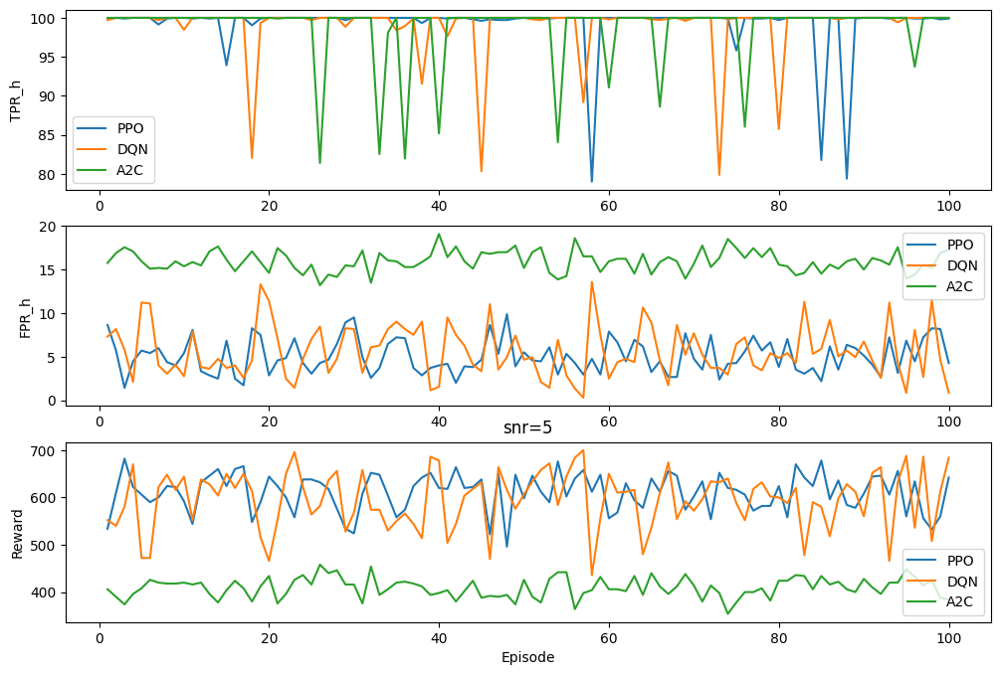

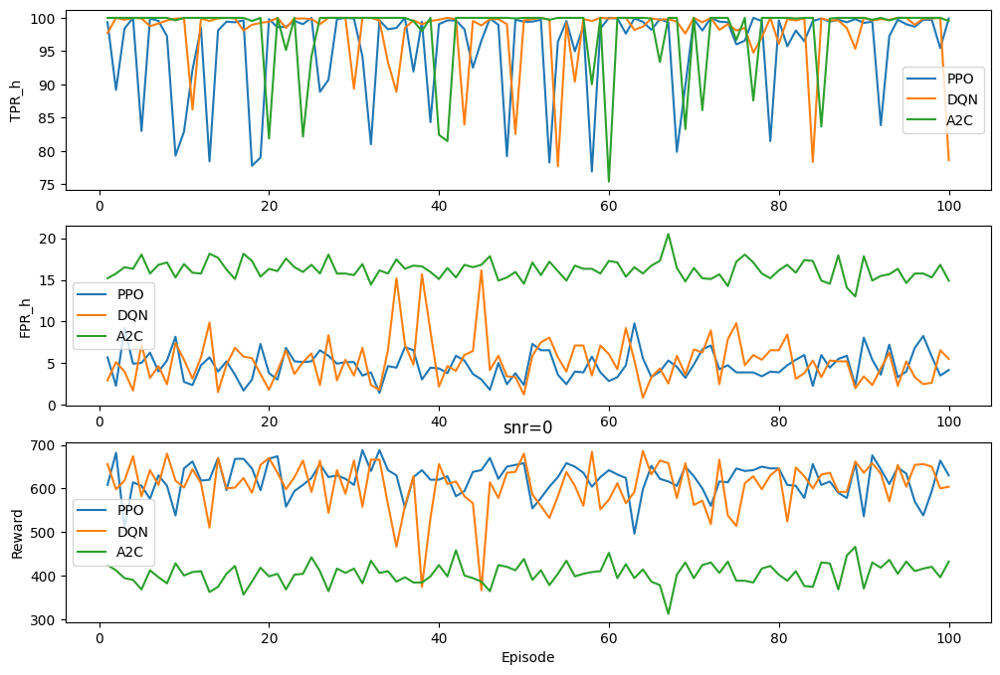

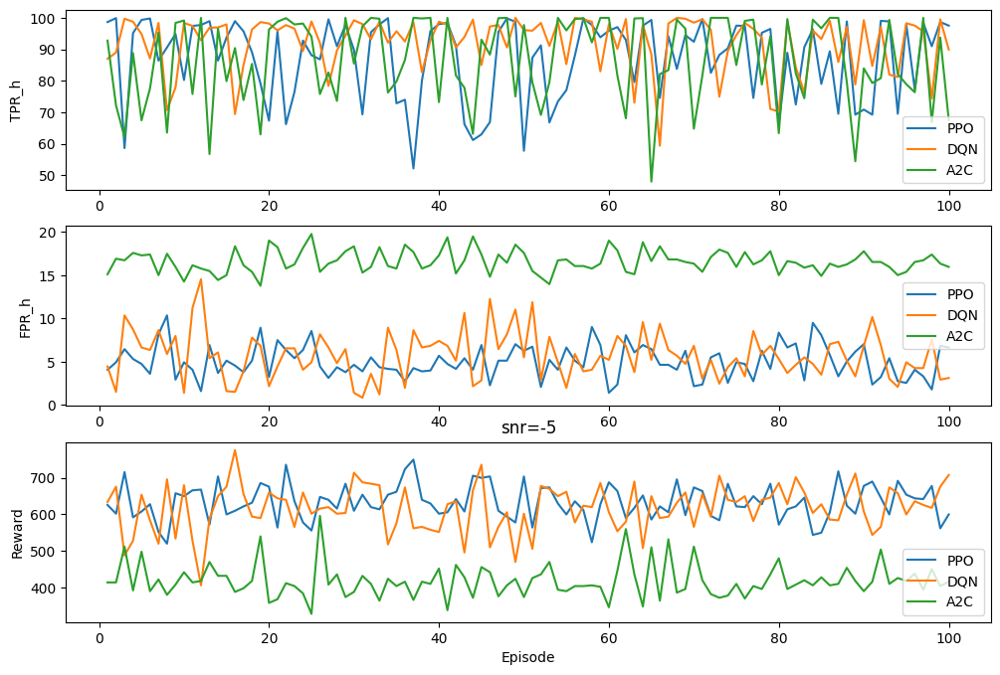

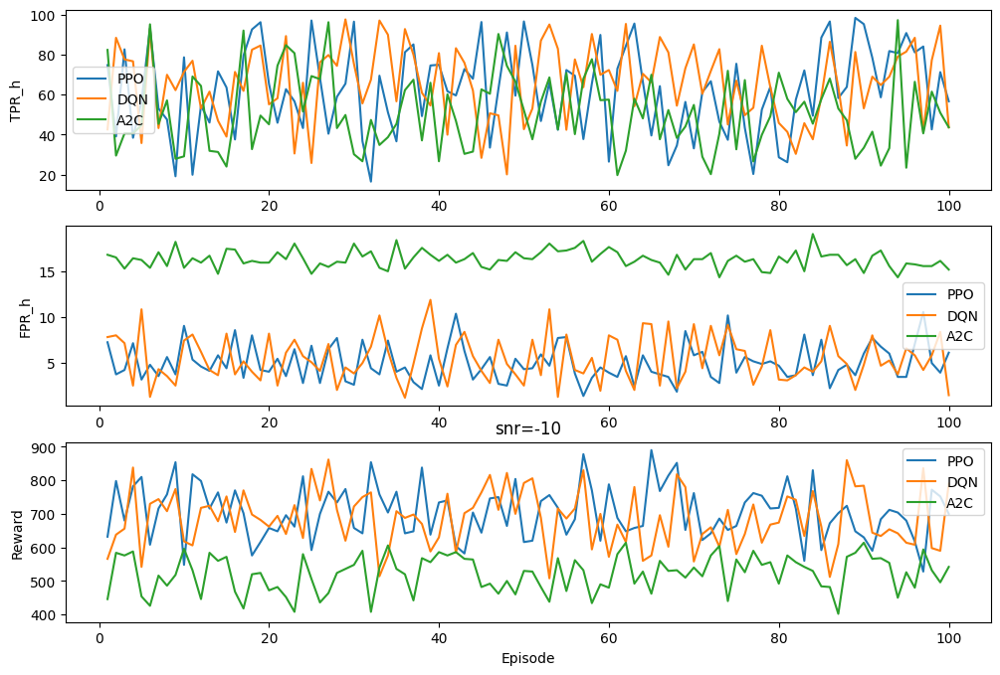

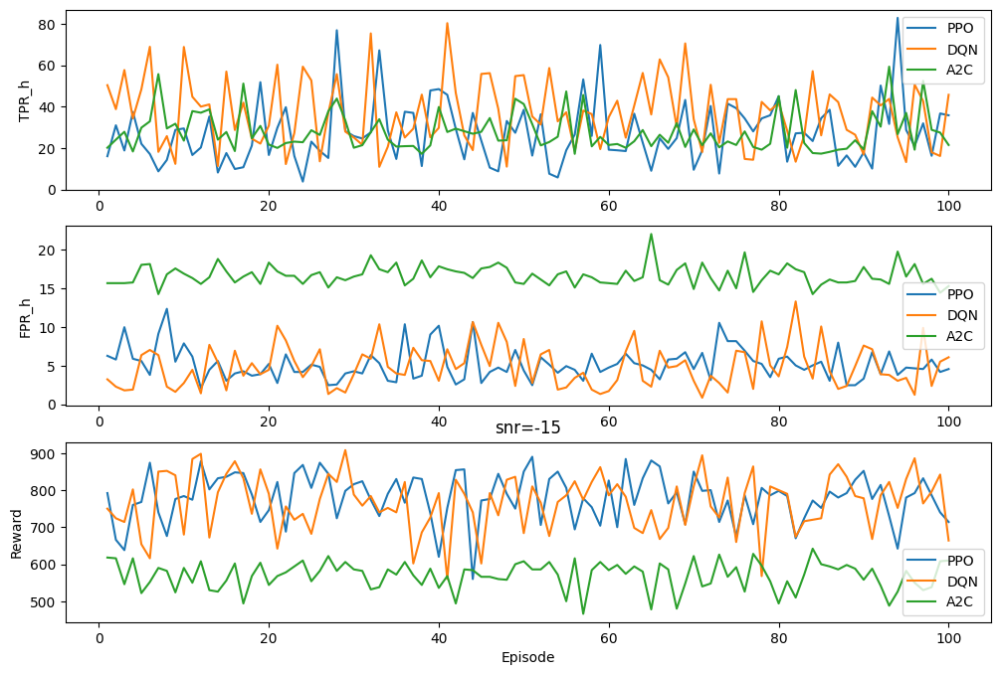

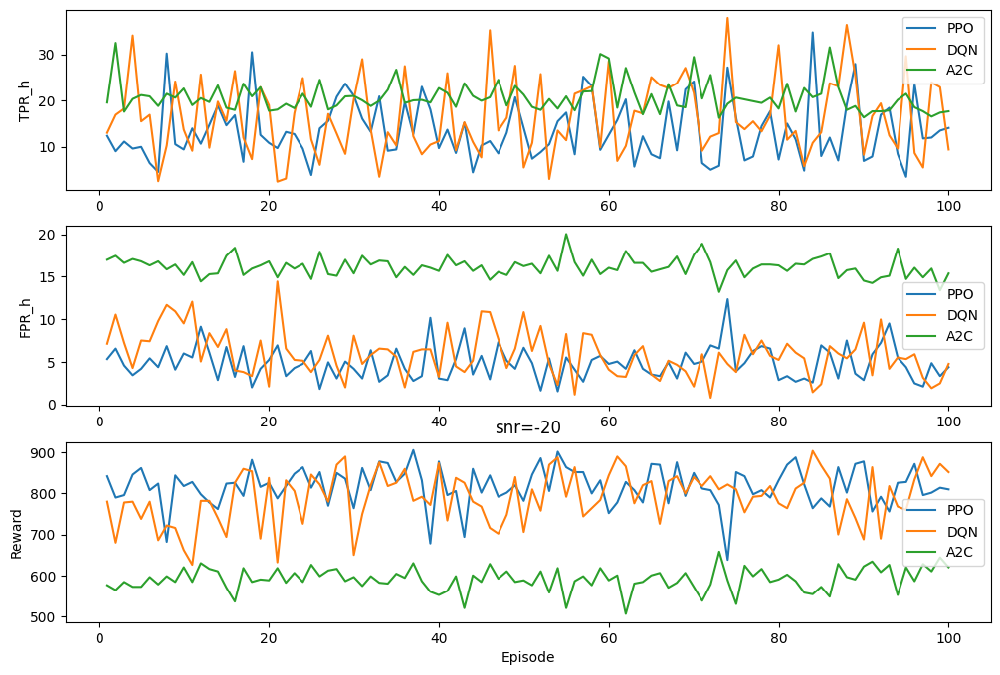

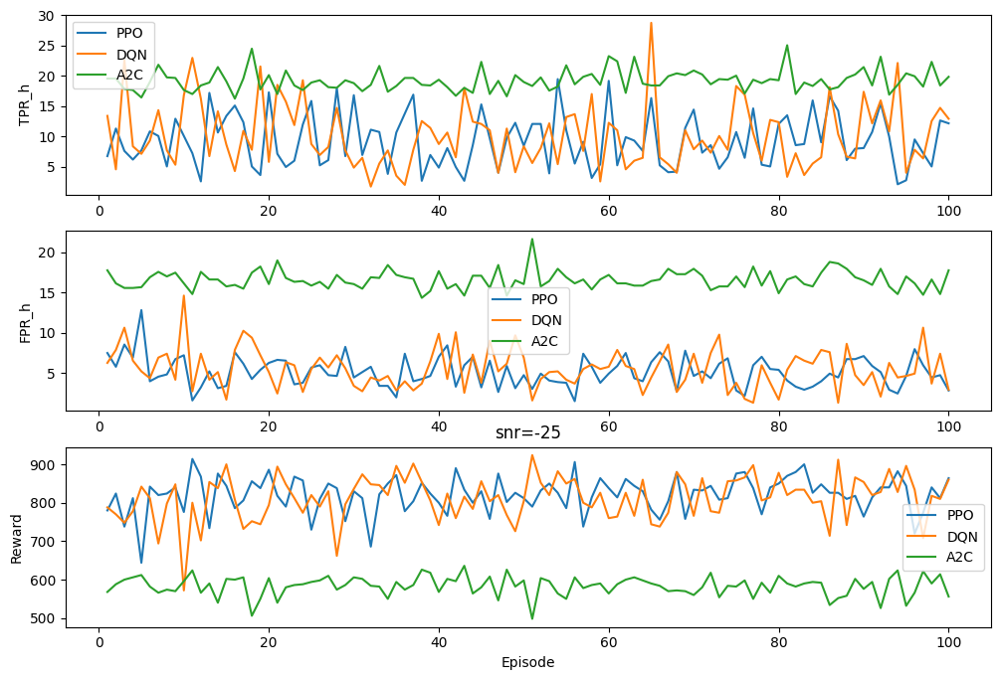

In [15]:
resdict = dict()
for snr in [5, 0, -5, -10, -15, -20, -25]:
    data = c_states_test[snr]
    # env = DummyVecEnv([lambda: FrequencyDetectionEnv(data)])
    eval_env = TEST_FrequencyDetectionEnv(data)
    num_episodes = 5

    # Evaluate both models
    tpr_ppo, fpr_ppo, rewards_ppo = my_evaluate_model(model_ppo, eval_env,num_episodes=num_episodes)
    tpr_dqn, fpr_dqn, rewards_dqn = my_evaluate_model(model_dqn, eval_env,model_name='dqn',num_episodes=num_episodes)
    tpr_a2c, fpr_a2c, rewards_a2c = my_evaluate_model(model_a2c, eval_env,num_episodes=num_episodes)

    episodes = range(1, num_episodes+1)

    plt.figure(figsize=(12, 8))

    # Plot TPR
    
    plt.subplot(3, 1, 1)
    plt.plot(episodes, tpr_ppo, label='PPO')
    plt.plot(episodes, tpr_dqn, label='DQN')
    plt.plot(episodes, tpr_a2c, label='A2C')
    plt.ylabel('TPR_h')
    plt.legend()

    # Plot FPR
    plt.subplot(3, 1, 2)
    plt.plot(episodes, fpr_ppo, label='PPO')
    plt.plot(episodes, fpr_dqn, label='DQN')
    plt.plot(episodes, fpr_a2c, label='A2C')
    plt.ylabel('FPR_h')
    plt.legend()

    # Plot Rewards
    plt.subplot(3, 1, 3)
    plt.plot(episodes, rewards_ppo, label='PPO')
    plt.plot(episodes, rewards_dqn, label='DQN')
    plt.plot(episodes, rewards_a2c, label='A2C')
    plt.xlabel('Episode')
    plt.ylabel('Reward')
    plt.legend()

    plt.title('snr='+str(snr))
    plt.show()

    resdict[snr] = {
        'TPR':{
            'PPO':tpr_ppo,
            'DQN':tpr_dqn,
            'A2C':tpr_a2c, 
        },
        'FPR':{
            'PPO':fpr_ppo,
            'DQN':fpr_dqn,
            'A2C':fpr_a2c
        },  
        'REW':{
            'PPO':rewards_ppo,
            'DQN':rewards_dqn,
            'A2C':rewards_a2c
        }        
    }

In [16]:
import pandas as pd

for snr in [5, 0, -5, -10, -15, -20, -25]:
    print(f'\nSNR = {snr}')
    print(f"FPR: \
        PPO: {np.round(np.mean(resdict[snr]['FPR']['PPO']),2)} \
        DQN: {np.round(np.mean(resdict[snr]['FPR']['DQN']),2)} \
        A2C: {np.round(np.mean(resdict[snr]['FPR']['A2C']),2)} \
          ")
    
    print(f"TPR: \
        PPO: {np.round(np.mean(resdict[snr]['TPR']['PPO']),2)} \
        DQN: {np.round(np.mean(resdict[snr]['TPR']['DQN']),2)} \
        A2C: {np.round(np.mean(resdict[snr]['TPR']['A2C']),2)} \
          ")
    
    print(f"REW: \
        PPO: {np.round(np.mean(resdict[snr]['REW']['PPO']),2)} \
        DQN: {np.round(np.mean(resdict[snr]['REW']['DQN']),2)} \
        A2C: {np.round(np.mean(resdict[snr]['REW']['A2C']),2)} \
          ")
    



SNR = 5
FPR:         PPO: 5.03         DQN: 5.63         A2C: 15.96           
TPR:         PPO: 99.24         DQN: 98.97         A2C: 98.73           
REW:         PPO: 610.88         DQN: 595.84         A2C: 409.56           

SNR = 0
FPR:         PPO: 4.73         DQN: 5.27         A2C: 16.2           
TPR:         PPO: 95.73         DQN: 97.92         A2C: 98.08           
REW:         PPO: 621.22         DQN: 606.66         A2C: 404.36           

SNR = -5
FPR:         PPO: 5.03         DQN: 5.73         A2C: 16.57           
TPR:         PPO: 87.14         DQN: 92.02         A2C: 86.67           
REW:         PPO: 633.08         DQN: 617.7         A2C: 418.38           

SNR = -10
FPR:         PPO: 4.97         DQN: 5.44         A2C: 16.32           
TPR:         PPO: 62.2         DQN: 65.76         A2C: 51.25           
REW:         PPO: 705.8         DQN: 685.88         A2C: 521.84           

SNR = -15
FPR:         PPO: 5.2         DQN: 4.9         A2C: 16.65           
TPR: 

In [17]:
model_ppo.save('final_comp_ppo_snr5-5.zip')
model_dqn.save('final_comp_dqn_snr5-5.zip')
model_a2c.save('final_comp_a2c_snr5-5.zip')

In [67]:
timesteps = 120*17*50
snr = 5
data = c_states[snr]

# Train PPO model
env = EVAL_FrequencyDetectionEnv(data[0])
model_ppo = PPO.load('comp_ppo_snr5-5.zip', env=env)
model_ppo.learn(total_timesteps=timesteps)
_, latest = env.reset()
print('\nPPO:')
print(latest)

# Train DQN model
env = EVAL_FrequencyDetectionEnv(data[0])
model_dqn = DQN.load('comp_dqn_snr5-5.zip', env=env)
model_dqn.learn(total_timesteps=timesteps)
_, latest = env.reset()
print('\nDQN:')
print(latest)

env = EVAL_FrequencyDetectionEnv(data[0])
model_a2c = A2C.load('comp_a2c_snr5-5.zip', env=env)
model_a2c.learn(total_timesteps=timesteps)
_, latest = env.reset()
print('\nA2C:')
print(latest)


Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.99e+03 |
|    ep_rew_mean     | 936      |
| time/              |          |
|    fps             | 1025     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.99e+03    |
|    ep_rew_mean          | 936         |
| time/                   |             |
|    fps                  | 735         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.002696515 |
|    clip_fraction        | 0.0104      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.00977 

In [68]:
model_ppo.save('retrain_comp_ppo_snr5-5.zip')
model_dqn.save('retrain_comp_dqn_snr5-5.zip')
model_a2c.save('retrain_comp_a2c_snr5-5.zip')

# EVAL (exp data, unfiltered)

In [50]:
with open('c_states_dict_exp.pkl', 'rb') as f:
    c_states_exp = pickle.load(f)

print(c_states_exp.keys())
print(c_states_exp[1,1].shape)

dict_keys([(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (4, 1), (4, 2), (4, 3), (4, 4), (4, 5), (5, 1), (5, 2), (5, 3), (5, 4), (5, 5), (6, 1), (6, 2), (6, 3), (6, 4), (6, 5), (7, 1), (7, 2), (7, 3), (7, 4), (7, 5), (8, 1), (8, 2), (8, 3), (8, 4), (8, 5), (9, 1), (9, 2), (9, 3), (9, 4), (9, 5), (10, 1), (10, 2), (10, 3), (10, 4), (10, 5), (11, 1), (11, 2), (11, 3), (11, 4), (11, 5)])
(18, 7, 58)


In [6]:
# def my_norm(vec):
#     vec = vec-np.mean(vec)
#     vec = vec/np.std(vec)
#     return vec

class EVAL_FrequencyDetectionEnv(gym.Env):
    """Custom Environment for Frequency Objective Response Detection that follows gymnasium interface"""

    def __init__(self, data):
        super(EVAL_FrequencyDetectionEnv, self).__init__()

        self.data = data
        self.episodes =  data.shape[2]-1
        self.frequencies = data.shape[0]-1
        self.measures = data.shape[1]
        self.windows = data.shape[2]-1
        self.current_episode = 0
        self.current_window = 2
        self.current_frequency = 0

        # Action space: 0 (no detection) or 1 (detection)
        self.action_space = spaces.Discrete(2)

        # Observation space: 5 measures for each of the 4 frequencies (1 focus + 3 noise)
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4*self.measures,), dtype=np.float32)

        # Initialize the internal state
        self.state = None
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0   
        self.tpr_hist = []
        self.fpr_hist = []  
        self.latest_result = {'tp_rate':np.nan,'fp_rate':np.nan}   

    def reset(self, seed=None, options=None):
        """Resets the environment to an initial state and returns the initial observation."""
        super().reset(seed=seed)
        
        if  self.current_episode< self.episodes:
            self.current_episode +=1
        else:
            self.current_episode = np.random.randint(0, self.episodes)

        self.current_window = 2
        self.current_frequency = 0
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0        
         
        self.tpr_hist = []
        self.fpr_hist = []
        
        # Initialize the state
        self.state = self._get_state(self.current_frequency, self.current_window)
        return self.state, self.latest_result

    def _get_state(self, frequency, window, episode= 0):
        """Helper function to get the state at a given frequency and window."""
         
        if episode != 0:
            self.current_episode = episode
         
        # print(frequency)
        focus_measure = self.data[frequency, :, window]
        
        # Select 3 random noise frequencies, excluding the current focus frequency
        noise_indices = np.setdiff1d(np.arange(9, 17), frequency - 9 if frequency >= 9 else [])
        noise_frequencies = np.random.choice(noise_indices, 3, replace=False)
        noise_measures = [self.data[nf, :, window] for nf in noise_frequencies]
         
        # measures = my_norm(np.concatenate(([focus_measure], noise_measures), axis=0).flatten())
        measures = np.concatenate(([focus_measure], noise_measures), axis=0).flatten()
       
        return np.array(measures, dtype=np.float32)

    def step(self, action, episode = -1):
        """Executes one time step within the environment."""
        # Returns:
        # tuple (observation, reward, terminated, truncated, info).
        # Return type:
        # Tuple[Tuple | Dict[str, Any] | ndarray | int, float, bool, bool, Dict]

        if episode != -1:
            self.current_episode = episode

        reward = 0
        fp_des = 0.01

        should_detect = self.current_frequency <= 8
        if action == 1:
            if should_detect:
                self.true_positives += 1
            else:
                self.false_positives += 1

        self.current_frequency += 1
        window_done = self.current_frequency >= self.frequencies
        epsiode_terminated = self.current_window >= self.windows
        info = {'tp_rate':np.nan,'fp_rate':np.nan}
        if window_done:
            self.state = self._get_state(self.current_frequency-1, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn


            self.tp_rate = 100*self.true_positives / (self.frequencies//2+1)
            self.fp_rate = 100*self.false_positives / (self.frequencies//2+1)

            self.tpr_hist.append(self.tp_rate)
            self.fpr_hist.append(self.fp_rate)

            if not(epsiode_terminated):
                self.current_window += 1
                self.current_frequency = 0
                self.true_positives = 0
                self.false_positives = 0
                    
        if epsiode_terminated:
            self.state = self._get_state(self.current_frequency, self.current_window)

            self.tp_rate = 100*self.true_positives / (self.current_frequency+1)
            self.fp_rate = 100*self.false_positives / (self.current_frequency+1)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn
           
            truncated = False

            info = {'tp_rate':np.round(np.mean(self.tpr_hist),2),'fp_rate':np.round(np.mean(self.fpr_hist),2)}
            self.latest_result = info

            self.tpr_hist = []
            self.fpr_hist = [] 
            self.current_window = 2
            self.current_frequency = 0
            self.true_positives = 0
            self.false_positives = 0

        else:
            self.state = self._get_state(self.current_frequency, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn

            truncated = False

        reward = tp-fp-fn+tn

        return self.state, reward, epsiode_terminated, truncated, info

    def render(self, mode='human'):
        """Render the environment for visualization purposes."""
        if mode =='human':
            print(f'Window: {self.current_window}, Frequency: {self.current_frequency},TP: {self.tp_rate}, FP: {self.fp_rate}')

    def close(self):
        """Clean up any resources used by the environment."""
        pass

In [73]:

for ivol in range(1,12):
    for iint in range(1,6):
        c_states_exp[ivol,iint] = np.nan_to_num(c_states_exp[ivol,iint], nan=0, posinf=10, neginf=-10)

# Validate the trained model
intensidades = ['70','60','50','40','30']

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp[ivol,iint] 
        env = EVAL_FrequencyDetectionEnv(data)
        obs, info = env.reset()
        model = PPO.load('final_comp_ppo_snr5-5.zip', env=env)

        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                print(info)
            env.close()

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 9.9, 'fp_rate': 1.82}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 31.31, 'fp_rate': 1.01}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 41.01, 'fp_rate': 13.33}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 22.22, 'fp_rate': 0.81}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 30.51, 'fp_rate': 3.23}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 19.6, 'fp_rate': 8.89}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 21.21, 'fp_rate': 6.67}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 15.96, 'fp_rate': 2.02}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'

In [72]:
for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp[ivol,iint] 
        env = EVAL_FrequencyDetectionEnv(data)
        obs, info = env.reset()
        model = DQN.load('final_comp_dqn_snr5-5.zip', env=env)

        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                print(info)
            env.close()


Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 34.95, 'fp_rate': 13.94}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 52.73, 'fp_rate': 3.03}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 61.82, 'fp_rate': 34.14}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 26.87, 'fp_rate': 0.4}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 50.1, 'fp_rate': 6.46}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 45.05, 'fp_rate': 25.66}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 44.85, 'fp_rate': 11.92}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 38.18, 'fp_rate': 5.05}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv

In [74]:
for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp[ivol,iint] 
        env = EVAL_FrequencyDetectionEnv(data)
        obs, info = env.reset()
        model = A2C.load('final_comp_a2c_snr5-5.zip', env=env)

        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                print(info)
            env.close()


Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 13.13, 'fp_rate': 6.87}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 25.45, 'fp_rate': 2.02}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 29.49, 'fp_rate': 8.28}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 9.9, 'fp_rate': 1.01}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 22.63, 'fp_rate': 3.84}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 23.23, 'fp_rate': 13.33}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 11.11, 'fp_rate': 6.87}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 12.12, 'fp_rate': 6.06}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{

# EVAL 2 (exp data, filtered)

In [77]:
with open('c_states_dict_exp_filt.pkl', 'rb') as f:
    c_states_exp_filt = pickle.load(f)

print(c_states_exp_filt.keys())
print(c_states_exp_filt[1,1].shape)

dict_keys([(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (4, 1), (4, 2), (4, 3), (4, 4), (4, 5), (5, 1), (5, 2), (5, 3), (5, 4), (5, 5), (6, 1), (6, 2), (6, 3), (6, 4), (6, 5), (7, 1), (7, 2), (7, 3), (7, 4), (7, 5), (8, 1), (8, 2), (8, 3), (8, 4), (8, 5), (9, 1), (9, 2), (9, 3), (9, 4), (9, 5), (10, 1), (10, 2), (10, 3), (10, 4), (10, 5), (11, 1), (11, 2), (11, 3), (11, 4), (11, 5)])
(18, 7, 58)


In [78]:

for ivol in range(1,12):
    for iint in range(1,6):
        c_states_exp_filt[ivol,iint] = np.nan_to_num(c_states_exp_filt[ivol,iint], nan=0, posinf=10, neginf=-10)

# Validate the trained model
intensidades = ['70','60','50','40','30']

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp_filt[ivol,iint] 
        env = EVAL_FrequencyDetectionEnv(data)
        obs, info = env.reset()

        model = PPO.load('final_comp_ppo_snr5-5.zip', env=env)
        
        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                print(info)
            env.close()

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 9.09, 'fp_rate': 1.41}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 30.51, 'fp_rate': 1.01}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 25.86, 'fp_rate': 5.25}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 19.6, 'fp_rate': 1.41}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 31.72, 'fp_rate': 5.05}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 12.12, 'fp_rate': 7.68}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 3.64, 'fp_rate': 62.83}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 16.36, 'fp_rate': 3.64}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'

In [76]:

for ivol in range(1,12):
    for iint in range(1,6):
        c_states_exp_filt[ivol,iint] = np.nan_to_num(c_states_exp_filt[ivol,iint], nan=0, posinf=10, neginf=-10)

# Validate the trained model
intensidades = ['70','60','50','40','30']

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp_filt[ivol,iint] 
        env = EVAL_FrequencyDetectionEnv(data)
        obs, info = env.reset()
        model = DQN.load('final_comp_dqn_snr5-5.zip', env=env)

        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                print(info)
            env.close()

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 79.6, 'fp_rate': 31.72}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 81.62, 'fp_rate': 13.33}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 89.9, 'fp_rate': 36.57}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 70.91, 'fp_rate': 10.71}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 81.62, 'fp_rate': 21.82}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 82.83, 'fp_rate': 27.27}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 75.76, 'fp_rate': 80.0}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 85.45, 'fp_rate': 10.91}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVec

In [75]:

for ivol in range(1,12):
    for iint in range(1,6):
        c_states_exp_filt[ivol,iint] = np.nan_to_num(c_states_exp_filt[ivol,iint], nan=0, posinf=10, neginf=-10)

# Validate the trained model
intensidades = ['70','60','50','40','30']

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp_filt[ivol,iint] 
        env = EVAL_FrequencyDetectionEnv(data)
        obs, info = env.reset()
        model = A2C.load('final_comp_a2c_snr5-5.zip', env=env)

        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                print(info)
            env.close()

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 31.52, 'fp_rate': 5.05}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 54.75, 'fp_rate': 6.26}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 70.1, 'fp_rate': 14.14}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 39.8, 'fp_rate': 7.47}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 53.54, 'fp_rate': 8.48}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 58.79, 'fp_rate': 15.76}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 44.04, 'fp_rate': 61.82}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
{'tp_rate': 38.79, 'fp_rate': 8.08}
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

# Curva PD-SNR

In [79]:
with open('c_states_dict_acer_v3.pkl', 'rb') as f:
    c_states = pickle.load(f)

print(c_states.keys())

dict_keys([10, 9.5, 9, 8.5, 8, 7.5, 7, 6.5, 6, 5.5, 5, 4.5, 4, 3.5, 3, 2.5, 2, 1.5, 1, 0.5, 0, -0.5, -1, -1.5, -2, -2.5, -3, -3.5, -4, -4.5, -5, -5.5, -6, -6.5, -7, -7.5, -8, -8.5, -9, -9.5, -10, -10.5, -11, -11.5, -12, -12.5, -13, -13.5, -14, -14.5, -15, -15.5, -16, -16.5, -17, -17.5, -18, -18.5, -19, -19.5, -20, -20.5, -21, -21.5, -22, -22.5, -23, -23.5, -24, -24.5, -25])


In [179]:
ntotal = len(c_states.keys())
resdict4 = dict()
for i,snr in enumerate(c_states.keys()):
    print(f'{i+1}/{ntotal}')
    data = c_states[snr]
    # env = DummyVecEnv([lambda: FrequencyDetectionEnv(data)])
    eval_env = TEST_FrequencyDetectionEnv(data)
    model_ppo = PPO.load('final_comp_ppo_snr5-5.zip', env = env)
    model_dqn = DQN.load('final_comp_dqn_snr5-5.zip', env = env)
    model_a2c = A2C.load('final_comp_a2c_snr5-5.zip', env = env)


    
    num_episodes = 5

    # Evaluate both models
    timesteps = (data.shape[0]())
    model_ppo.learn(total_timesteps=timesteps)
    tpr_ppo, fpr_ppo, rewards_ppo = my_evaluate_model(model_ppo, eval_env,num_episodes=num_episodes)

    model_ppo.learn(total_timesteps=timesteps)
    tpr_dqn, fpr_dqn, rewards_dqn = my_evaluate_model(model_dqn, eval_env,model_name='dqn',num_episodes=num_episodes)
    tpr_a2c, fpr_a2c, rewards_a2c = my_evaluate_model(model_a2c, eval_env,num_episodes=num_episodes)

    resdict4[snr] = {
        'TPR':{
            'PPO':tpr_ppo,
            'DQN':tpr_dqn,
            'A2C':tpr_a2c, 
        },
        'FPR':{
            'PPO':fpr_ppo,
            'DQN':fpr_dqn,
            'A2C':fpr_a2c
        },  
        'REW':{
            'PPO':rewards_ppo,
            'DQN':rewards_dqn,
            'A2C':rewards_a2c
        }        
    }

1/71
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
2/71
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
3/71
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
4/71
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
5/71
Wrapping the env with a `Monitor` wrapper
Wrapping 

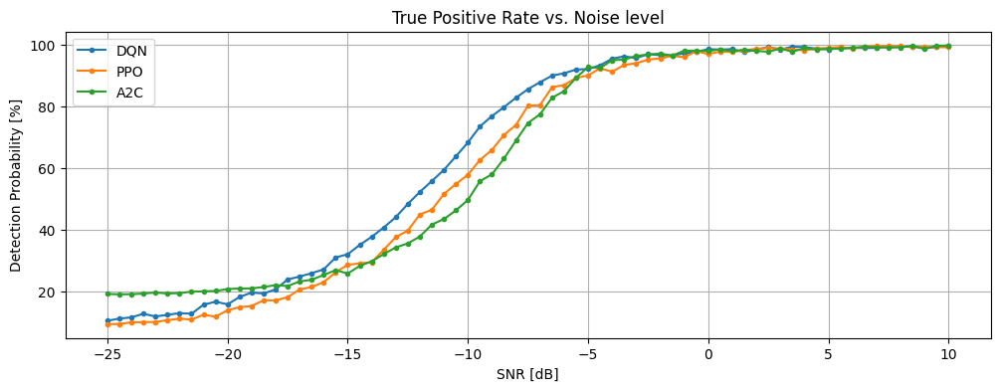

In [184]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('True Positive Rate vs. Noise level')
plt.ylabel('Detection Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
plt.legend()
plt.show()


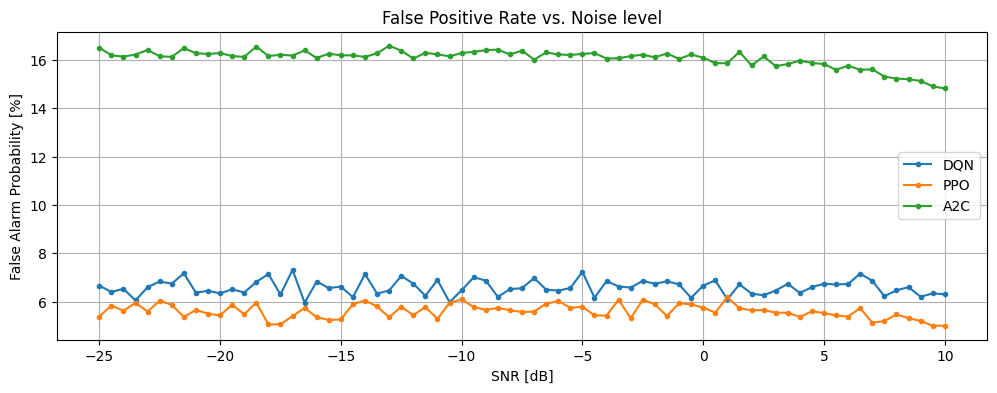

In [185]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('False Positive Rate vs. Noise level')
plt.ylabel('False Alarm Probability [%]')
plt.xlabel('SNR [dB]')
plt.legend()
plt.grid(True)
plt.show()


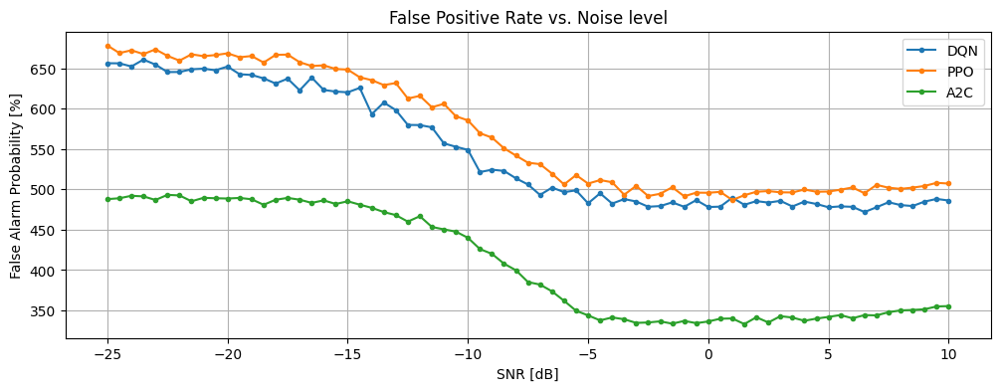

In [187]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['REW']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['REW']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['REW']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('False Positive Rate vs. Noise level')
plt.ylabel('False Alarm Probability [%]')
plt.xlabel('SNR [dB]')
plt.legend()
plt.grid(True)
plt.show()


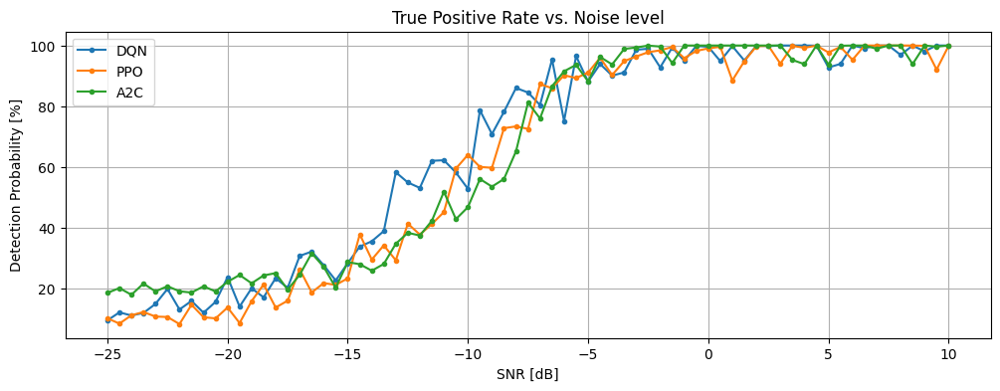

In [182]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['TPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['TPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['TPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('True Positive Rate vs. Noise level')
plt.ylabel('Detection Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
plt.legend()
plt.show()


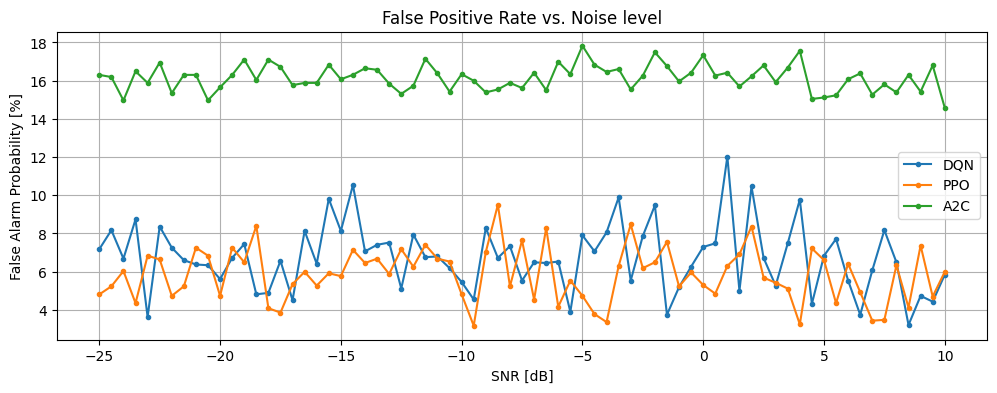

In [183]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['FPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['FPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['FPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('False Positive Rate vs. Noise level')
plt.ylabel('False Alarm Probability [%]')
plt.xlabel('SNR [dB]')
plt.legend()
plt.grid(True)
plt.show()


In [186]:
# Save to file
with open('final_resdict4_comparing_3_models.pkl', 'wb') as f:
    pickle.dump(resdict4, f)

# Curva para detectores originais

In [104]:
with open('c_states_dict_acer_v3.pkl', 'rb') as f:
    c_states = pickle.load(f)

for i in c_states.keys():
    c_states[i] = np.nan_to_num(c_states[i], nan=0, posinf=10, neginf=-10)
print(c_states.keys())

dict_keys([10, 9.5, 9, 8.5, 8, 7.5, 7, 6.5, 6, 5.5, 5, 4.5, 4, 3.5, 3, 2.5, 2, 1.5, 1, 0.5, 0, -0.5, -1, -1.5, -2, -2.5, -3, -3.5, -4, -4.5, -5, -5.5, -6, -6.5, -7, -7.5, -8, -8.5, -9, -9.5, -10, -10.5, -11, -11.5, -12, -12.5, -13, -13.5, -14, -14.5, -15, -15.5, -16, -16.5, -17, -17.5, -18, -18.5, -19, -19.5, -20, -20.5, -21, -21.5, -22, -22.5, -23, -23.5, -24, -24.5, -25])


(500, 9, 100)
CSM
TPR:97.01741122565865
FPR:95.00025773195877
GFT
TPR:66.3537227949599
FPR:5.000229095074456
MSC
TPR:97.35990836197021
FPR:5.0


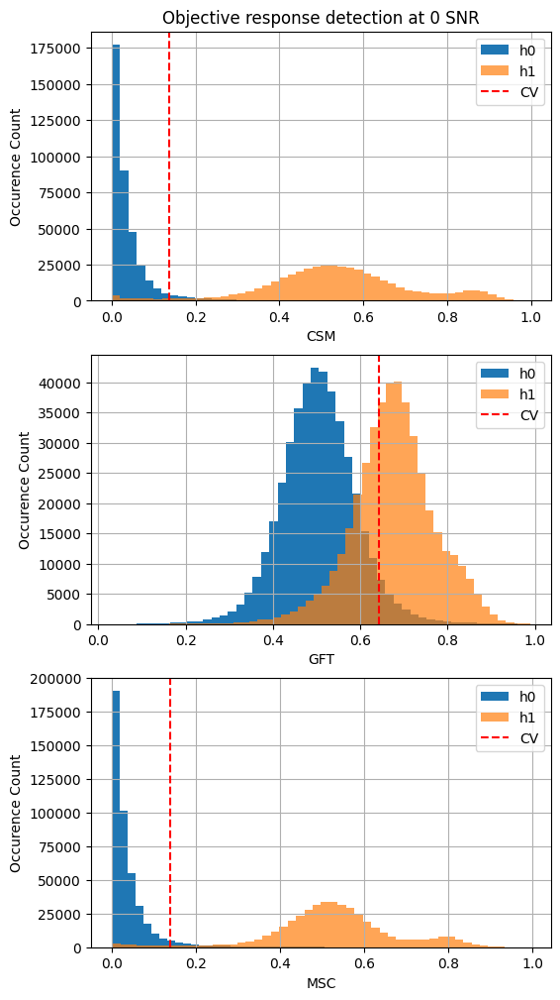

In [367]:
snr = 0 #10
# seleciona na snr, todos episodios, nas freqs de ruido, todas as janela
print(c_states[snr][:,9:,5,:].shape)
h0 = c_states[snr][:,9:,5,:].ravel()
h1 = c_states[snr][:,:9,5,:].ravel()

# csm = 0, gft = 1, msc = 2

# CSM
plt.figure(2, figsize=(6,12))

h0 = c_states[snr][:,9:17,0,3:].ravel()
h1 = c_states[snr][:,:9,0,3:].ravel()
print('CSM')
cv = np.quantile(10**h0,1-0.05)
lh0 = len(h0)
lh1 = len(h1)
print(f'TPR:{100*np.sum(np.where(10**h1>=cv,1,0))/lh1}')
print(f'FPR:{100*np.sum(np.where(10**h0<=cv,1,0))/lh0}')

plt.subplot(311)
plt.hist(10**h0, label='h0', bins = 50)
plt.hist(10**h1, alpha= 0.7, label='h1', bins = 50)
plt.axvline(cv,linestyle='--',color='r',label = 'CV')
plt.grid(True)
plt.ylabel('Occurence Count')
plt.xlabel('CSM')
plt.legend()
plt.title('Objective response detection at 0 SNR')

#GFT
plt.subplot(312)


h0 = c_states[snr][:,9:,1,3:].ravel()
h1 = c_states[snr][:,:9,1,3:].ravel()

print('GFT')
cv = np.quantile(10**h0,1-0.05)
lh0 = len(h0)
lh1 = len(h1)
print(f'TPR:{100*np.sum(np.where(10**h1>=cv,1,0))/lh1}')
print(f'FPR:{100*np.sum(np.where(10**h0>=cv,1,0))/lh0}')

plt.hist(10**h0, label='h0', bins = 50)
plt.hist(10**h1, alpha= 0.7, label='h1', bins = 50)
plt.axvline(cv,linestyle='--',color='r',label = 'CV')
plt.grid(True)
plt.ylabel('Occurence Count')
plt.xlabel('GFT')
plt.legend()


#MSC
plt.subplot(313)

h0 = c_states[snr][:,9:,2,3:].ravel()
h1 = c_states[snr][:,:9,2,3:].ravel()

print('MSC')
cv = np.quantile(10**h0,1-0.05)
lh0 = len(h0)
lh1 = len(h1)
print(f'TPR:{100*np.sum(np.where(10**h1>=cv,1,0))/lh1}')
print(f'FPR:{100*np.sum(np.where(10**h0>=cv,1,0))/lh0}')

plt.hist(10**h0, label='h0', bins = 50)
plt.hist(10**h1, alpha= 0.7, label='h1', bins = 50)
plt.axvline(cv,linestyle='--',color='r',label = 'CV')
plt.grid(True)
plt.ylabel('Occurence Count')
plt.xlabel('MSC')
plt.legend()

plt.show()


In [237]:
resdict3 = dict()
for i,snr in enumerate(c_states.keys()):
    # print(f'{i+1}/{ntotal}')
    data = c_states[snr]
    # print(data.shape)
    
    h0_csm = c_states[snr][:,9:,0,3:].ravel()
    h1_csm = c_states[snr][:,:9,0,3:].ravel()

    h0_gft = c_states[snr][:,9:,1,3:].ravel()
    h1_gft = c_states[snr][:,:9,1,3:].ravel()

    h0_msc = c_states[snr][:,9:,2,3:].ravel()
    h1_msc = c_states[snr][:,:9,2,3:].ravel()

    cv_csm = np.quantile(10**np.random.choice(h0_csm,size = 8*100, replace= False),1-0.05)
    cv_gft = np.quantile(10**np.random.choice(h0_gft,size = 8*100, replace= False),1-0.05)
    cv_msc = np.quantile(10**np.random.choice(h0_msc,size = 8*100, replace= False),1-0.05)    

    resdict3[snr] = {
        'TPR':{
            'CSM':100*np.sum(np.where(10**h1_csm>=cv_csm,1,0))/len(h1_csm),
            'GFT':100*np.sum(np.where(10**h1_gft>=cv_gft,1,0))/len(h1_gft),
            'MSC':100*np.sum(np.where(10**h1_msc>=cv_msc,1,0))/len(h1_msc), 
        },
        'FPR':{
            'CSM':100*np.sum(np.where(10**h0_csm>=cv_csm,1,0))/len(h0_csm),
            'GFT':100*np.sum(np.where(10**h0_gft>=cv_gft,1,0))/len(h0_gft),
            'MSC':100*np.sum(np.where(10**h0_msc>=cv_msc,1,0))/len(h0_msc)
        }       
    }    

    # cv_csm = np.quantile(h0_csm,1-0.05)
    # cv_gft = np.quantile(h0_gft,1-0.05)
    # cv_msc = np.quantile(h0_msc,1-0.05)    

    # resdict3[snr] = {
    #     'TPR':{
    #         'CSM':100*np.sum(np.where(h1_csm>=cv,1,0))/len(h1_csm),
    #         'GFT':100*np.sum(np.where(h1_gft>=cv,1,0))/len(h1_gft),
    #         'MSC':100*np.sum(np.where(h1_msc>=cv,1,0))/len(h1_msc), 
    #     },
    #     'FPR':{
    #         'CSM':100*np.sum(np.where(h0_csm>=cv,1,0))/len(h0_csm),
    #         'GFT':100*np.sum(np.where(h0_gft>=cv,1,0))/len(h0_gft),
    #         'MSC':100*np.sum(np.where(h0_msc>=cv,1,0))/len(h0_msc)
    #     }       
    # }    

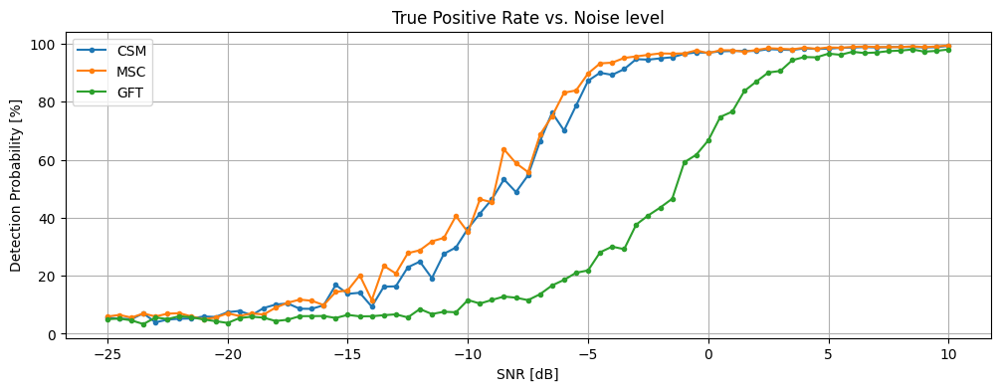

In [217]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['GFT'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')



plt.title('True Positive Rate vs. Noise level')
plt.ylabel('Detection Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
legenda = ['MSC', 'GFT','CSM']
legenda.reverse()
plt.legend()
plt.show()


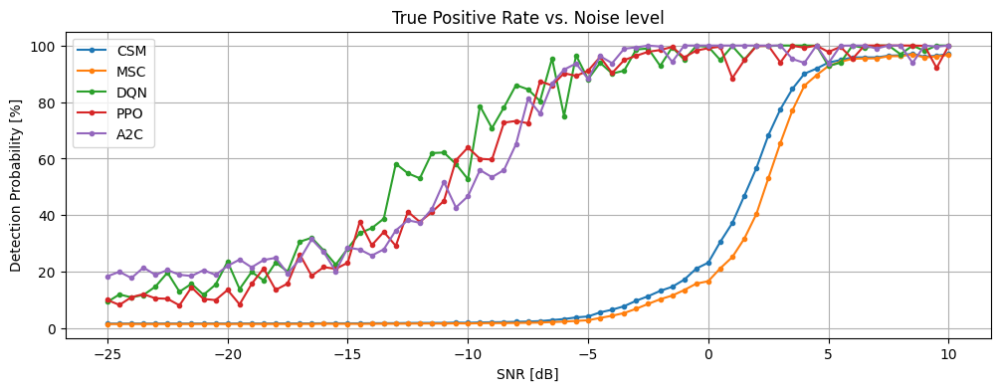

In [194]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

# snr_vec = []
# res_vec = []
# for snr in resdict3.keys():
#     snr_vec.append(snr)
#     res_vec.append(resdict3[snr]['TPR']['GFT'])
# plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

# plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['TPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['TPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['TPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('True Positive Rate vs. Noise level')
plt.ylabel('Detection Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
plt.legend()
plt.show()


# plt.title('True Positive Rate vs. Noise level')
# plt.ylabel('Detection Probability [%]')
# plt.xlabel('SNR [dB]')
# plt.grid(True)
# plt.legend()
# plt.show()

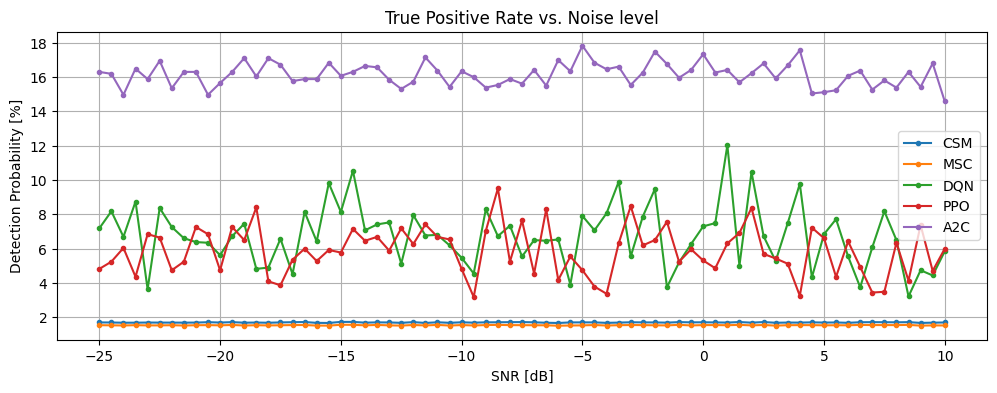

In [178]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

# snr_vec = []
# res_vec = []
# for snr in resdict3.keys():
#     snr_vec.append(snr)
#     res_vec.append(resdict3[snr]['FPR']['GFT'])
# plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

# plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['FPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['FPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict2.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict2[snr]['FPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('False Alarm Rate vs. Noise level')
plt.ylabel('False Positive Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
# legenda = ['A2C', 'PPO', 'DQN', 'MSC', 'GFT','CSM']
# legenda.reverse()
plt.legend()
plt.show()


# plt.title('True Positive Rate vs. Noise level')
# plt.ylabel('Detection Probability [%]')
# plt.xlabel('SNR [dB]')
# plt.grid(True)
# plt.legend()
# plt.show()

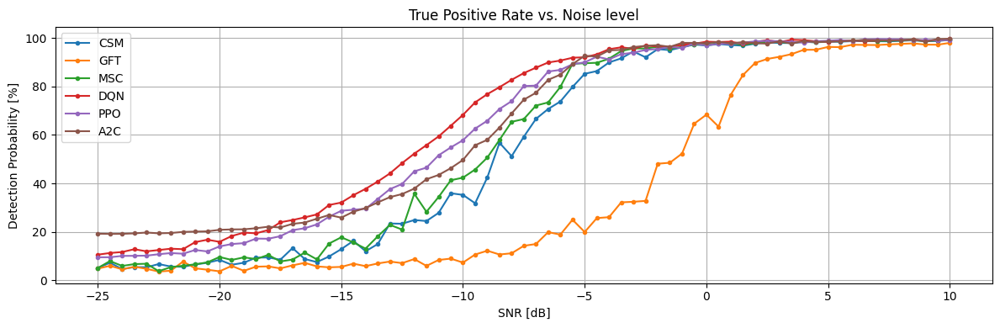

In [315]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['GFT'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

# plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('True Positive Rate vs. Noise level')
plt.ylabel('Detection Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()


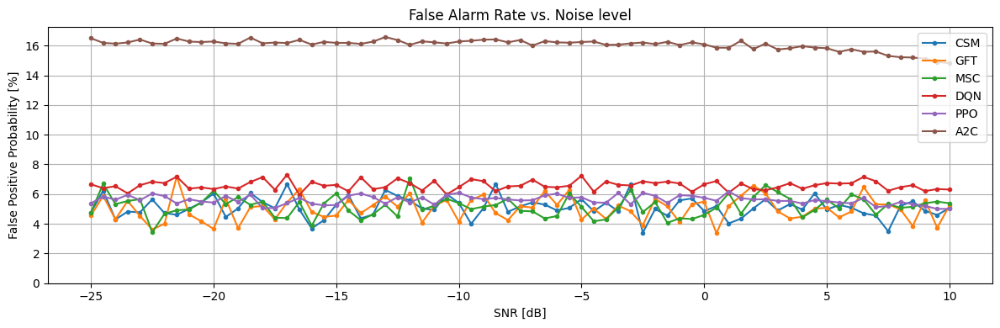

In [316]:
plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['GFT'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

# plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('False Alarm Rate vs. Noise level')
plt.ylabel('False Positive Probability [%]')
plt.xlabel('SNR [dB]')
plt.ylim([0,plt.gca().get_ylim()[1]])
plt.tight_layout()
plt.grid(True)
# legenda = ['A2C', 'PPO', 'DQN', 'MSC', 'GFT','CSM']
# legenda.reverse()
plt.legend()
plt.show()


# plt.title('True Positive Rate vs. Noise level')
# plt.ylabel('Detection Probability [%]')
# plt.xlabel('SNR [dB]')
# plt.grid(True)
# plt.legend()
# plt.show()

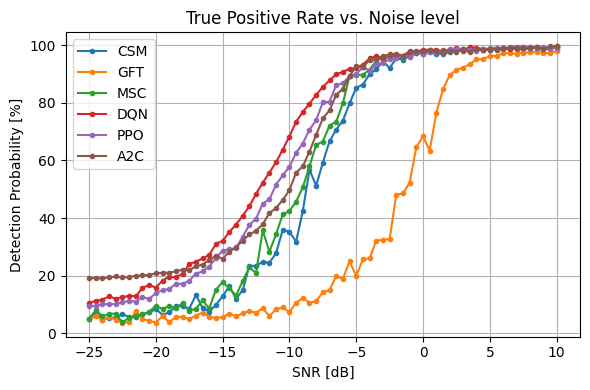

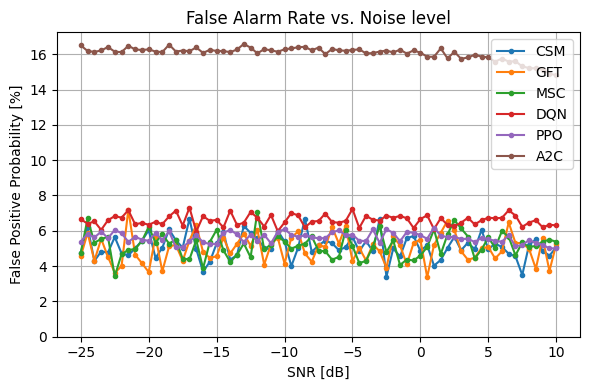

In [355]:
plt.figure(figsize=(6,4))
# plt.subplot(121)
snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['GFT'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['TPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

# plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['TPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('True Positive Rate vs. Noise level')
plt.ylabel('Detection Probability [%]')
plt.xlabel('SNR [dB]')
plt.grid(True)
plt.tight_layout()
plt.legend()

plt.show()
plt.figure(figsize=(6,4))
# plt.subplot(122)
snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['CSM'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'CSM')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['GFT'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'GFT')

snr_vec = []
res_vec = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    res_vec.append(resdict3[snr]['FPR']['MSC'])
plt.plot(snr_vec, res_vec,marker = '.', label = 'MSC')

# plt.figure(figsize=(12,4))

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['DQN']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'DQN')

snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['PPO']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'PPO')


snr_vec = []
res_vec = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    res_vec.append(np.mean(resdict4[snr]['FPR']['A2C']))
plt.plot(snr_vec, res_vec,marker = '.', label = 'A2C')

plt.title('False Alarm Rate vs. Noise level')
plt.ylabel('False Positive Probability [%]')
plt.xlabel('SNR [dB]')
plt.ylim([0,plt.gca().get_ylim()[1]])
plt.tight_layout()
plt.grid(True)
# legenda = ['A2C', 'PPO', 'DQN', 'MSC', 'GFT','CSM']
# legenda.reverse()
plt.legend()
plt.show()


# plt.title('True Positive Rate vs. Noise level')
# plt.ylabel('Detection Probability [%]')
# plt.xlabel('SNR [dB]')
# plt.grid(True)
# plt.legend()
# plt.show()

In [286]:
import numpy as np
from scipy.stats import ttest_ind

snr_vec = []
fpr_msc = []
for snr in resdict3.keys():
    snr_vec.append(snr)
    fpr_msc.append(resdict3[snr]['FPR']['MSC'])

snr_vec = []
fpr_dqn = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    fpr_dqn.append(np.mean(resdict4[snr]['FPR']['DQN']))

snr_vec = []
fpr_ppo = []
for snr in resdict4.keys():
    snr_vec.append(snr)
    fpr_ppo.append(np.mean(resdict4[snr]['FPR']['PPO']))

t_statistic, p_value = ttest_ind(fpr_msc, fpr_ppo)
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

# Interpretation
alpha = 0.05
if p_value < alpha:
    print("We reject the null hypothesis that the arrays are equal.")
else:
    print("We fail to reject the null hypothesis that the arrays are equal.")

T-statistic: -4.86961324302398
P-value: 2.9803242986221685e-06
We reject the null hypothesis that the arrays are equal.


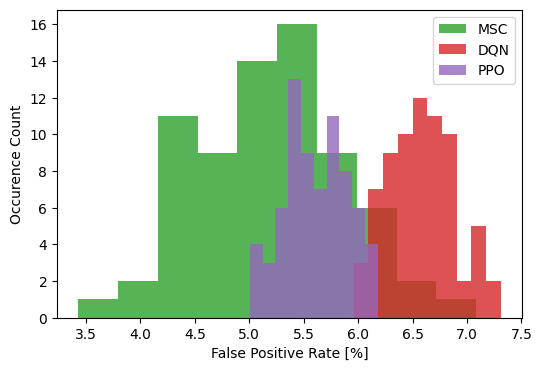

In [337]:
plt.figure(figsize=(6,4))
plt.hist(fpr_msc, alpha = .8, label= 'MSC', color = 'tab:green')
plt.hist(fpr_dqn, alpha = .8, label = 'DQN', color = 'tab:red')
plt.hist(fpr_ppo, alpha = .8, label = 'PPO', color = 'tab:purple')
plt.legend()
plt.ylabel('Occurence Count')
plt.xlabel('False Positive Rate [%]')
plt.show()

# EVAL (with finetuning)

In [23]:
class EVAL_FINETUNE_FrequencyDetectionEnv(gym.Env):
    """Custom Environment for Frequency Objective Response Detection that follows gymnasium interface"""

    def __init__(self, data):
        super(EVAL_FINETUNE_FrequencyDetectionEnv, self).__init__()

        self.data = data
        self.episodes =  data.shape[2]-1
        self.frequencies = data.shape[0]-1
        self.measures = data.shape[1]
        self.windows = data.shape[2]-1
        self.current_episode = 0
        self.current_window = 2
        self.current_frequency = 0

        # Action space: 0 (no detection) or 1 (detection)
        self.action_space = spaces.Discrete(2)

        # Observation space: 5 measures for each of the 4 frequencies (1 focus + 3 noise)
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4*self.measures,), dtype=np.float32)

        # Initialize the internal state
        self.state = None
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0   
        self.tpr_hist = []
        self.fpr_hist = []  
        self.latest_result = {'tp_rate':np.nan,'fp_rate':np.nan}   

    def reset(self, seed=None, options=None):
        """Resets the environment to an initial state and returns the initial observation."""
        super().reset(seed=seed)
        
        if  self.current_episode< self.episodes:
            self.current_episode +=1
        else:
            self.current_episode = np.random.randint(0, self.episodes)

        self.current_window = 2
        self.current_frequency = 0
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0        
         
        self.tpr_hist = []
        self.fpr_hist = []
        
        # Initialize the state
        self.state = self._get_state(self.current_frequency, self.current_window)
        return self.state, self.latest_result

    def _get_state(self, frequency, window, episode= 0):
        """Helper function to get the state at a given frequency and window."""
         
        if episode != 0:
            self.current_episode = episode
         
        # print(frequency)
        focus_measure = self.data[frequency, :, window]
        
        # Select 3 random noise frequencies, excluding the current focus frequency
        noise_indices = np.setdiff1d(np.arange(9, 17), frequency - 9 if frequency >= 9 else [])
        noise_frequencies = np.random.choice(noise_indices, 3, replace=False)
        noise_measures = [self.data[nf, :, window] for nf in noise_frequencies]
         
        # measures = my_norm(np.concatenate(([focus_measure], noise_measures), axis=0).flatten())
        measures = np.concatenate(([focus_measure], noise_measures), axis=0).flatten()
       
        return np.array(measures, dtype=np.float32)

    def step(self, action, episode = -1):
        """Executes one time step within the environment."""
        # Returns:
        # tuple (observation, reward, terminated, truncated, info).
        # Return type:
        # Tuple[Tuple | Dict[str, Any] | ndarray | int, float, bool, bool, Dict]

        if episode != -1:
            self.current_episode = episode

        reward = 0
        fp_des = 0

        should_detect = self.current_frequency <= 8
        if action == 1:
            if should_detect:
                self.true_positives += 1
            else:
                self.false_positives += 1

        self.current_frequency += 1
        window_done = self.current_frequency >= self.frequencies
        epsiode_terminated = self.current_window >= self.windows
        info = {'tp_rate':np.nan,'fp_rate':np.nan}
        if window_done:
            self.state = self._get_state(self.current_frequency-1, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn


            self.tp_rate = 100*self.true_positives / (self.frequencies//2+1)
            self.fp_rate = 100*self.false_positives / (self.frequencies//2+1)

            reward = +( -(((100-fp_des)**2)/100 +(fp_des**2)/-100) +((self.fp_rate)**2)/(-100)+ ((self.tp_rate)**2)/(100) )
            
            self.tpr_hist.append(self.tp_rate)
            self.fpr_hist.append(self.fp_rate)

            if not(epsiode_terminated):
                self.current_window += 1
                self.current_frequency = 0
                self.true_positives = 0
                self.false_positives = 0
                    
        if epsiode_terminated:
            self.state = self._get_state(self.current_frequency, self.current_window)

            self.tp_rate = 100*self.true_positives / (self.current_frequency+1)
            self.fp_rate = 100*self.false_positives / (self.current_frequency+1)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn
            
            reward = +( -(((100-fp_des)**2)/100+(fp_des**2)/-100)
                    +((np.round(np.mean(self.fpr_hist),4))**2)/(-100)
                    +((np.round(np.mean(self.tpr_hist),4))**2)/(100))
           
            truncated = False

            info = {'tp_rate':np.round(np.mean(self.tpr_hist),2),'fp_rate':np.round(np.mean(self.fpr_hist),2), 
                    'tp_hist:':self.tpr_hist,'fp_hist:':self.fpr_hist}
            
            # print(info)
            self.latest_result = info

            self.tpr_hist = []
            self.fpr_hist = [] 
            self.current_window = 2
            self.current_frequency = 0
            self.true_positives = 0
            self.false_positives = 0

        else:
            self.state = self._get_state(self.current_frequency, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 1
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 1
                else:
                    tn = 1

            reward = tp-fp-fn+tn

            truncated = False

        # reward = tp-fp-fn+tn

        return self.state, reward, epsiode_terminated, truncated, info

    def render(self, mode='human'):
        """Render the environment for visualization purposes."""
        if mode =='human':
            print(f'Window: {self.current_window}, Frequency: {self.current_frequency},TP: {self.tp_rate}, FP: {self.fp_rate}')

    def close(self):
        """Clean up any resources used by the environment."""
        pass

In [24]:
class EVAL_NOTRUE_FrequencyDetectionEnv(gym.Env):
    """Custom Environment for Frequency Objective Response Detection that follows gymnasium interface"""

    def __init__(self, data):
        super(EVAL_NOTRUE_FrequencyDetectionEnv, self).__init__()

        self.data = data
        self.episodes =  data.shape[2]-1
        self.frequencies = data.shape[0]-1
        self.measures = data.shape[1]
        self.windows = data.shape[2]-1
        self.current_episode = 0
        self.current_window = 2
        self.current_frequency = 0

        # Action space: 0 (no detection) or 1 (detection)
        self.action_space = spaces.Discrete(2)

        # Observation space: 5 measures for each of the 4 frequencies (1 focus + 3 noise)
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4*self.measures,), dtype=np.float32)

        # Initialize the internal state
        self.state = None
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0   
        self.tpr_hist = []
        self.fpr_hist = []  
        self.latest_result = {'tp_rate':np.nan,'fp_rate':np.nan}   

    def reset(self, seed=None, options=None):
        """Resets the environment to an initial state and returns the initial observation."""
        super().reset(seed=seed)
        
        if  self.current_episode< self.episodes:
            self.current_episode +=1
        else:
            self.current_episode = np.random.randint(0, self.episodes)

        self.current_window = 2
        self.current_frequency = 0
        self.false_positives = 0
        self.true_positives = 0
        self.fp_rate = 0
        self.tp_rate = 0        
         
        self.tpr_hist = []
        self.fpr_hist = []
        
        # Initialize the state
        self.state = self._get_state(self.current_frequency, self.current_window)
        return self.state, self.latest_result

    def _get_state(self, frequency, window, episode= 0):
        """Helper function to get the state at a given frequency and window."""
         
        if episode != 0:
            self.current_episode = episode
         
        # print(frequency)
        focus_measure = self.data[frequency, :, window]
        
        # Select 3 random noise frequencies, excluding the current focus frequency
        noise_indices = np.setdiff1d(np.arange(9, 17), frequency - 9 if frequency >= 9 else [])
        noise_frequencies = np.random.choice(noise_indices, 3, replace=False)
        noise_measures = [self.data[nf, :, window] for nf in noise_frequencies]
         
        # measures = my_norm(np.concatenate(([focus_measure], noise_measures), axis=0).flatten())
        measures = np.concatenate(([focus_measure], noise_measures), axis=0).flatten()
       
        return np.array(measures, dtype=np.float32)

    def step(self, action, episode = -1):
        """Executes one time step within the environment."""
        # Returns:
        # tuple (observation, reward, terminated, truncated, info).
        # Return type:
        # Tuple[Tuple | Dict[str, Any] | ndarray | int, float, bool, bool, Dict]

        if episode != -1:
            self.current_episode = episode

        reward = 0
        fp_des = 0

        should_detect = self.current_frequency <= 8
        if action == 1:
            if should_detect:
                self.true_positives += 1
            else:
                self.false_positives += 1

        self.current_frequency += 1
        window_done = self.current_frequency >= self.frequencies
        epsiode_terminated = self.current_window >= self.windows
        info = {'tp_rate':np.nan,'fp_rate':np.nan}
        if window_done:
            self.state = self._get_state(self.current_frequency-1, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn


            self.tp_rate = 100*self.true_positives / (self.frequencies//2+1)
            self.fp_rate = 100*self.false_positives / (self.frequencies//2+1)

            reward = +( -(((100-fp_des)**2)/100 +(fp_des**2)/-100) +((self.fp_rate)**2)/(-100)+ ((self.tp_rate)**2)/(100) )
            
            self.tpr_hist.append(self.tp_rate)
            self.fpr_hist.append(self.fp_rate)

            if not(epsiode_terminated):
                self.current_window += 1
                self.current_frequency = 0
                self.true_positives = 0
                self.false_positives = 0
                    
        if epsiode_terminated:
            self.state = self._get_state(self.current_frequency, self.current_window)

            self.tp_rate = 100*self.true_positives / (self.current_frequency+1)
            self.fp_rate = 100*self.false_positives / (self.current_frequency+1)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn
            
            reward = +( -(((100-fp_des)**2)/100+(fp_des**2)/-100)
                    +((np.round(np.mean(self.fpr_hist),4))**2)/(-100)
                    +((np.round(np.mean(self.tpr_hist),4))**2)/(100))
           
            truncated = False

            info = {'tp_rate':np.round(np.mean(self.tpr_hist),2),'fp_rate':np.round(np.mean(self.fpr_hist),2), 
                    'tp_hist:':self.tpr_hist,'fp_hist:':self.fpr_hist}
            
            # print(info)
            self.latest_result = info

            self.tpr_hist = []
            self.fpr_hist = [] 
            self.current_window = 2
            self.current_frequency = 0
            self.true_positives = 0
            self.false_positives = 0

        else:
            self.state = self._get_state(self.current_frequency, self.current_window)

            should_detect = self.current_frequency <= 8
            tp = 0; fp = 0; fn =0; tn = 0
            if action == 1:
                if should_detect:
                    tp = 0
                else:
                    fp = 1
            else:
                if should_detect:
                    fn = 0
                else:
                    tn = 1

            reward = tp-fp-fn+tn

            truncated = False

        # reward = tp-fp-fn+tn

        return self.state, reward, epsiode_terminated, truncated, info

    def render(self, mode='human'):
        """Render the environment for visualization purposes."""
        if mode =='human':
            print(f'Window: {self.current_window}, Frequency: {self.current_frequency},TP: {self.tp_rate}, FP: {self.fp_rate}')

    def close(self):
        """Clean up any resources used by the environment."""
        pass

In [ ]:
# model_ppo = PPO.load('final_comp_ppo_snr5-5.zip', env = env)
    # model_dqn = DQN.load('final_comp_dqn_snr5-5.zip', env = env)
    # model_a2c = A2C.load('final_comp_a2c_snr5-5.zip', env = env)

In [ ]:
with open('c_states_dict_exp.pkl', 'rb') as f:
    c_states_exp = pickle.load(f)

print(c_states_exp.keys())
print(c_states_exp[1,1].shape)

for ivol in range(1,12):
    for iint in range(1,6):
        c_states_exp[ivol,iint] = np.nan_to_num(c_states_exp[ivol,iint], nan=0, posinf=10, neginf=-10)


In [ ]:
# Fine-tune the pretrained model
intensidades = ['70','60','50','40','30']

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    
    # Only 1st voluntary used on pretraining
    ivol = 1
    data = c_states_exp[ivol,iint] 
    env = EVAL_FINETUNE_FrequencyDetectionEnv(data)
    obs, info = env.reset()
     
    if iint ==1: # On first run, initialize model as copy of pretrained
        model = DQN.load('mini_dqn_snr5.zip', env=env)
    else:
        model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

    model.learn((data.shape[2]-1)*(data.shape[0]-1))
    obs, info = env.reset()
    # hist_tp.append(info['tp_rate'])
    # hist_fp.append(info['fp_rate'])
    print(info)

    model.save('exp_retrain2_mini_snr5.zip')

# Validate the trained model
hist_tpr = []
hist_fpr = [] 
for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        
        data = c_states_exp[ivol,iint] 
        env = EVAL_NOTRUE_FrequencyDetectionEnv(data)
        obs, info = env.reset()

        model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

        for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
            action, _states = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, info = env.step(action)

            if terminated:
                obs, info = env.reset()
                hist_tpr.append(info['tp_rate'])
                hist_fpr.append(info['fp_rate'])
                # print(info)
            env.close()


print(f'TPR:{np.mean(hist_tpr)}')
print(f'FPR:{np.mean(hist_fpr)}')
print(hist_tpr)
print(hist_fpr)

# EVAL 2 (with finetuning)

In [11]:
with open('../database/c_states_dict_exp_filt.pkl', 'rb') as f:
    c_states_exp_filt = pickle.load(f)

print(c_states_exp_filt.keys())
print(c_states_exp_filt[1,1].shape)

for ivol in range(1,12):
    for iint in range(1,6):
        c_states_exp_filt[ivol,iint] = np.nan_to_num(c_states_exp_filt[ivol,iint], nan=0, posinf=10, neginf=-10)

dict_keys([(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (4, 1), (4, 2), (4, 3), (4, 4), (4, 5), (5, 1), (5, 2), (5, 3), (5, 4), (5, 5), (6, 1), (6, 2), (6, 3), (6, 4), (6, 5), (7, 1), (7, 2), (7, 3), (7, 4), (7, 5), (8, 1), (8, 2), (8, 3), (8, 4), (8, 5), (9, 1), (9, 2), (9, 3), (9, 4), (9, 5), (10, 1), (10, 2), (10, 3), (10, 4), (10, 5), (11, 1), (11, 2), (11, 3), (11, 4), (11, 5)])
(18, 7, 58)


In [31]:
# Fine-tune the pretrained model
intensidades = ['70','60','50','40','30']

seen = {}
for iint in range(1,6):
    for ivol in range(1,12):
        seen[ivol, iint] = 0

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    
    # Only 1st voluntary used on pretraining
    ivol = np.random.randint(1,11)
    seen[ivol, iint] = 1

    data = c_states_exp_filt[ivol,iint] 
    env = EVAL_FINETUNE_FrequencyDetectionEnv(data)
    obs, info = env.reset()
     
    if iint ==1: # On first run, initialize model as copy of pretrained
        model = DQN.load('../models/final_comp_dqn_snr5-5.zip', env=env) # mini_dqn_snr5.zip # final_comp_dqn_snr5-5.zip
        # model = DQN.load('mini_dqn_snr0.zip', env=env)
    else:
        model = DQN.load('new_exp_retrain_comp_dqn_snr5-5.zip', env=env) # exp_retrain2_mini_snr5.zip # exp_retrain_comp_dqn_snr5-5.zip
        # model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

    model.learn((data.shape[2]-1)*(data.shape[0]-1))
    obs, info = env.reset()
    # hist_tp.append(info['tp_rate'])
    # hist_fp.append(info['fp_rate'])
    # print(info)

    model.save('new_exp_retrain_comp_dqn_snr5-5.zip')
    # model.save('exp_retrain2_mini_snr5.zip')

# Validate the trained model
hist_tpr_dqn = []
hist_fpr_dqn = [] 
for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        if not(seen[ivol, iint] == 1):
        
            data = c_states_exp_filt[ivol,iint] 
            env = EVAL_NOTRUE_FrequencyDetectionEnv(data)
            obs, info = env.reset()

            model = DQN.load('new_exp_retrain_comp_dqn_snr5-5.zip', env=env)
            # model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

            for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
                action, _states = model.predict(obs, deterministic=True)
                obs, reward, terminated, truncated, info = env.step(action)

                if terminated:
                    obs, info = env.reset()
                    hist_tpr_dqn.append(info['tp_rate'])
                    hist_fpr_dqn.append(info['fp_rate'])
                    # print(info)
                env.close()

print(f'TPR:{np.mean(hist_tpr_dqn)}')
print(f'FPR:{np.mean(hist_fpr_dqn)}')
# print(hist_fpr_dqn)
# print(hist_fpr_dqn)

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Intensidade: 60 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Intensidade: 50 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Intensidade: 40 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Intensidade: 30 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env with a `Monitor` wrapp

In [32]:
# Fine-tune the pretrained model
intensidades = ['70','60','50','40','30']

seen = {}
for iint in range(1,6):
    for ivol in range(1,12):
        seen[ivol, iint] = 0

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    
    # Only 1st voluntary used on pretraining
    ivol = np.random.randint(1,11)
    seen[ivol, iint] = 1

    data = c_states_exp_filt[ivol,iint] 
    env = EVAL_FINETUNE_FrequencyDetectionEnv(data)
    obs, info = env.reset()
     
    if iint ==1: # On first run, initialize model as copy of pretrained
        model = PPO.load('../models/final_comp_ppo_snr5-5.zip', env=env) # mini_dqn_snr5.zip # final_comp_dqn_snr5-5.zip
        # model = DQN.load('mini_dqn_snr0.zip', env=env)
    else:
        model = PPO.load('new_exp_retrain_comp_ppo_snr5-5.zip', env=env) # exp_retrain2_mini_snr5.zip # exp_retrain_comp_dqn_snr5-5.zip
        # model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

    model.learn((data.shape[2]-1)*(data.shape[0]-1))
    # model.learn((1)*(data.shape[0]-1))
    obs, info = env.reset()
    # hist_tp.append(info['tp_rate'])
    # hist_fp.append(info['fp_rate'])
    # print(info)

    model.save('new_exp_retrain_comp_ppo_snr5-5.zip')
    # model.save('exp_retrain2_mini_snr5.zip')

# Validate the trained model
hist_tpr_ppo = []
hist_fpr_ppo = [] 
for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        if not(seen[ivol, iint] == 1):
        
            data = c_states_exp_filt[ivol,iint] 
            env = EVAL_NOTRUE_FrequencyDetectionEnv(data)
            obs, info = env.reset()

            model = PPO.load('new_exp_retrain_comp_ppo_snr5-5.zip', env=env)
            # model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

            for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
                action, _states = model.predict(obs, deterministic=True)
                obs, reward, terminated, truncated, info = env.step(action)

                if terminated:
                    obs, info = env.reset()
                    hist_tpr_ppo.append(info['tp_rate'])
                    hist_fpr_ppo.append(info['fp_rate'])
                    # print(info)
                env.close()

print(f'TPR:{np.mean(hist_tpr_ppo)}')
print(f'FPR:{np.mean(hist_fpr_ppo)}')
# print(hist_fpr_dqn)
# print(hist_fpr_dqn)

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 936      |
|    ep_rew_mean     | -31.1    |
| time/              |          |
|    fps             | 1172     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
Intensidade: 60 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-----------------------------
| time/              |      |
|    fps             | 966  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 2.98e+03    |
|    ep_rew_mean          | 112         |
| time/                   |             |
|    fps                  | 665         |
|    i

In [33]:
# Fine-tune the pretrained model
intensidades = ['70','60','50','40','30']

seen = {}
for iint in range(1,6):
    for ivol in range(1,12):
        seen[ivol, iint] = 0

for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    
    # Only 1st voluntary used on pretraining
    ivol = np.random.randint(1,11)
    seen[ivol, iint] = 1

    data = c_states_exp_filt[ivol,iint] 
    env = EVAL_FINETUNE_FrequencyDetectionEnv(data)
    obs, info = env.reset()
     
    if iint ==1: # On first run, initialize model as copy of pretrained
        model = A2C.load('../models/final_comp_a2c_snr5-5.zip', env=env) # mini_dqn_snr5.zip # final_comp_dqn_snr5-5.zip
        # model = DQN.load('mini_dqn_snr0.zip', env=env)
    else:
        model = A2C.load('new_exp_retrain_comp_a2c_snr5-5.zip', env=env) # exp_retrain2_mini_snr5.zip # exp_retrain_comp_dqn_snr5-5.zip
        # model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

    model.learn((data.shape[2]-1)*(data.shape[0]-1))
    # model.learn((1)*(data.shape[0]-1))
    obs, info = env.reset()
    # hist_tp.append(info['tp_rate'])
    # hist_fp.append(info['fp_rate'])
    # print(info)

    model.save('new_exp_retrain_comp_a2c_snr5-5.zip')
    # model.save('exp_retrain2_mini_snr5.zip')

# Validate the trained model
hist_tpr_a2c = []
hist_fpr_a2c = [] 
for iint in range(1,6):
    print(f'Intensidade: {intensidades[iint-1]} dB')
    for ivol in range(1,12):
        if not(seen[ivol, iint] == 1):
        
            data = c_states_exp_filt[ivol,iint] 
            env = EVAL_NOTRUE_FrequencyDetectionEnv(data)
            obs, info = env.reset()

            model = A2C.load('new_exp_retrain_comp_a2c_snr5-5.zip', env=env)
            # model = DQN.load('exp_retrain2_mini_snr5.zip', env=env)

            for test_episode in range((data.shape[2]-1)*(data.shape[0]-1)):
                action, _states = model.predict(obs, deterministic=True)
                obs, reward, terminated, truncated, info = env.step(action)

                if terminated:
                    obs, info = env.reset()
                    hist_tpr_a2c.append(info['tp_rate'])
                    hist_fpr_a2c.append(info['fp_rate'])
                    # print(info)
                env.close()

print(f'TPR:{np.mean(hist_tpr_a2c)}')
print(f'FPR:{np.mean(hist_fpr_a2c)}')
# print(hist_fpr_dqn)
# print(hist_fpr_dqn)

Intensidade: 70 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-------------------------------------
| time/                 |           |
|    fps                | 232       |
|    iterations         | 100       |
|    time_elapsed       | 2         |
|    total_timesteps    | 500       |
| train/                |           |
|    entropy_loss       | -0.00071  |
|    explained_variance | 7.15e-07  |
|    learning_rate      | 0.0007    |
|    n_updates          | 2040099   |
|    policy_loss        | -0.000113 |
|    value_loss         | 2.22      |
-------------------------------------
Intensidade: 60 dB
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-------------------------------------
| time/                 |           |
|    fps                | 207       |
|    iterations         | 100       |
|    time_elapsed       | 2         |
|    total_timesteps    | 500       |
| train/                |           |
|    entro

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.arange(1,len(hist_tpr_ppo)+1), hist_tpr_ppo, color = 'tab:purple', marker = '.', label = 'PPO')
plt.plot(np.arange(1,len(hist_tpr_dqn)+1), hist_tpr_dqn, color = 'tab:red', marker = '.', label = 'DQN')
plt.plot(np.arange(1,len(hist_tpr_a2c)+1), hist_tpr_a2c, color = 'tab:brown', marker = '.', label = 'A2C')
plt.legend()
plt.show()

In [ ]:
import seaborn as sns
import pandas as pd

tpr = pd.DataFrame({'PPO':hist_tpr_ppo,'DQN':hist_tpr_dqn,'A2C':hist_tpr_a2c})
# tpr = pd.DataFrame({'DQN':hist_tpr_dqn,'A2C':hist_tpr_a2c})

fpr = pd.DataFrame({'PPO':hist_fpr_ppo,'DQN':hist_fpr_dqn,'A2C':hist_fpr_a2c})
# plt.hist(fpr_dqn, alpha = .5, label = 'DQN', color = 'tab:red')
# plt.hist(fpr_ppo, alpha = .5, label = 'PPO', color = 'tab:purple')
# plt.figure(figsize=(6,4))
plt.figure(figsize=(6,8))
plt.subplot(211)
sns.barplot(tpr,palette=['tab:purple', 'tab:red', 'tab:brown'])
plt.title('Detection Rate in Experimental ASSR')
plt.ylabel('True Positive Rate [%]')
plt.xlabel('DRL Algorithm')
plt.tight_layout()
# plt.show()

# plt.figure(figsize=(6,4))
plt.subplot(212)
sns.barplot(fpr,palette=['tab:purple', 'tab:red', 'tab:brown'])
plt.title('False Alarm Rate in Experimental ASSR')
plt.ylabel('False Positive Rate [%]')
plt.xlabel('DRL Algorithm')
plt.tight_layout()
plt.show()

In [36]:
np.mean(hist_tpr_dqn)

85.3494

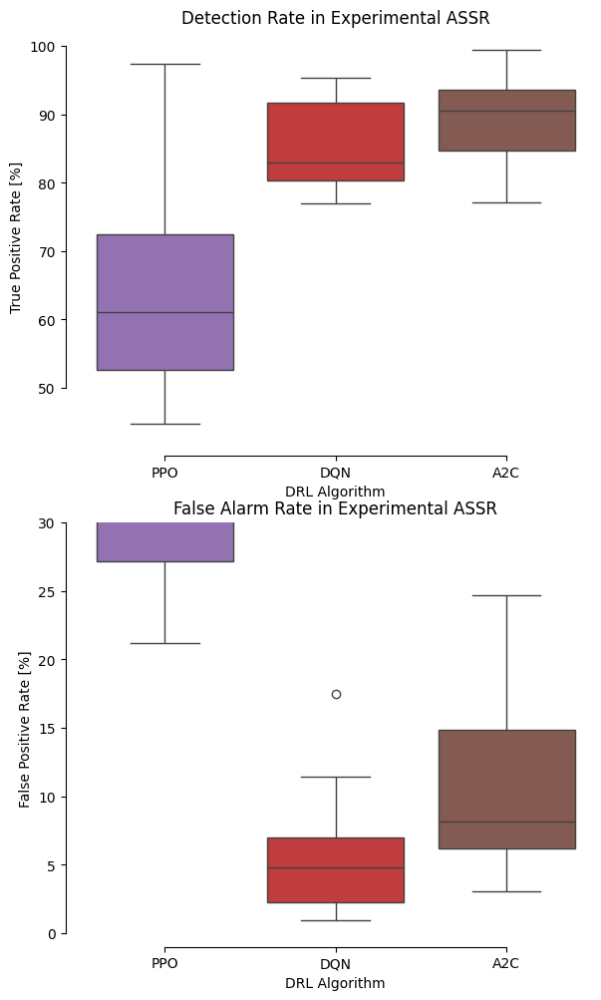

In [34]:
import seaborn as sns
import pandas as pd

tpr = pd.DataFrame({'PPO':hist_tpr_ppo,'DQN':hist_tpr_dqn,'A2C':hist_tpr_a2c})
# tpr = pd.DataFrame({'DQN':hist_tpr_dqn,'A2C':hist_tpr_a2c})

fpr = pd.DataFrame({'PPO':hist_fpr_ppo,'DQN':hist_fpr_dqn,'A2C':hist_fpr_a2c})
# plt.hist(fpr_dqn, alpha = .5, label = 'DQN', color = 'tab:red')
# plt.hist(fpr_ppo, alpha = .5, label = 'PPO', color = 'tab:purple')
# plt.figure(figsize=(6,4))
plt.figure(figsize=(6,10))
plt.subplot(211)
sns.boxplot(tpr,palette=['tab:purple', 'tab:red', 'tab:brown'])
plt.title('Detection Rate in Experimental ASSR')
plt.ylabel('True Positive Rate [%]')
plt.xlabel('DRL Algorithm')
plt.tight_layout()
# plt.show()

# plt.figure(figsize=(6,4))
plt.subplot(212)
sns.boxplot(fpr,palette=['tab:purple', 'tab:red', 'tab:brown'])
plt.title('False Alarm Rate in Experimental ASSR')
plt.ylabel('False Positive Rate [%]')
plt.xlabel('DRL Algorithm')
plt.ylim([0,30])
plt.tight_layout()
sns.despine(offset=10, trim=True)
plt.show()

In [375]:
print('tpr')
print(tpr.median())
print(tpr.mean())

print('fpr')
print(fpr.median())
print(fpr.mean())

tpr
PPO    56.660
DQN    81.595
A2C    84.185
dtype: float64
PPO    58.0838
DQN    81.0906
A2C    83.5674
dtype: float64
fpr
PPO    3.08
DQN    6.70
A2C    9.60
dtype: float64
PPO     5.0844
DQN     7.3050
A2C    14.0058
dtype: float64
